Connected to base (Python 3.12.12)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

    # 4. Pak de trainingsdata en stuur naar de 'n training' fase
    beste_model, naam, min_features_to_select = inner_loop(X_train_outer, y_train_outer)  
    # --- VISUALISATIE & FEATURE ANALYSE ---
    # 1. Haal de RFECV stap uit de pipeline
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # 2. Haal de namen van de features op
    # Eerst kijken we wat de VarianceCorrelationFilter doorliet
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Dan kijken we wat de RFECV daarvan heeft gekozen
    rfecv_mask = rfecv_stap.support_
    winnende_features = namen_na_filter[rfecv_mask]
    
    print(f"\n📊 Analyse Fold {i+1}:")
    print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
    print(f"Geselecteerde features: {winnende_features.tolist()}")

    # 3. De RFECV Grafiek (Score vs Aantal Features)
    plt.figure(figsize=(10, 5))
    # De x-as: van min_features tot totaal aantal geteste features
    x_range = range(rfecv_stap.min_features_to_select, 
                   len(rfecv_stap.cv_results_['mean_test_score']) + rfecv_stap.min_features_to_select)
    
    plt.plot(x_range, rfecv_stap.cv_results_['mean_test_score'], color='#2E86C1', lw=2, label='Gemiddelde Accuracy')
    
    # Voeg de standaarddeviatie toe als schaduw (geeft inzicht in stabiliteit)
    plt.fill_between(x_range, 
                     rfecv_stap.cv_results_['mean_test_score'] - rfecv_stap.cv_results_['std_test_score'],
                     rfecv_stap.cv_results_['mean_test_score'] + rfecv_stap.cv_results_['std_test_score'], 
                     alpha=0.2, color='#2E86C1')

    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} features)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
#     # --- NIEUW: Haal de winnaar en zijn instellingen op ---
#     # 1. De naam van de classifier (bijv. 'RandomForestClassifier')
#     clf_naam = type(beste_model.named_steps['clf']).__name__
    
#     # 2. De hyperparameters van alleen de classifier-stap
#     # We filteren de hele pipeline-lijst op alles wat met 'clf__' begint
#     alle_params = beste_model.get_params()
#     best_params_clf = {k.split('__')[1]: v for k, v in alle_params.items() if k.startswith('clf__')}
    
#     print(f"🏆 Winnaar Fold {i+1}: {clf_naam}")
#     print(f"⚙️ Instellingen: {best_params_clf}")
#     # -----------------------------------------------------

#     # De rest van je code...
#     data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names)
#     alle_analyse_data.append(data_fold)

NameError: name 'data' is not defined

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


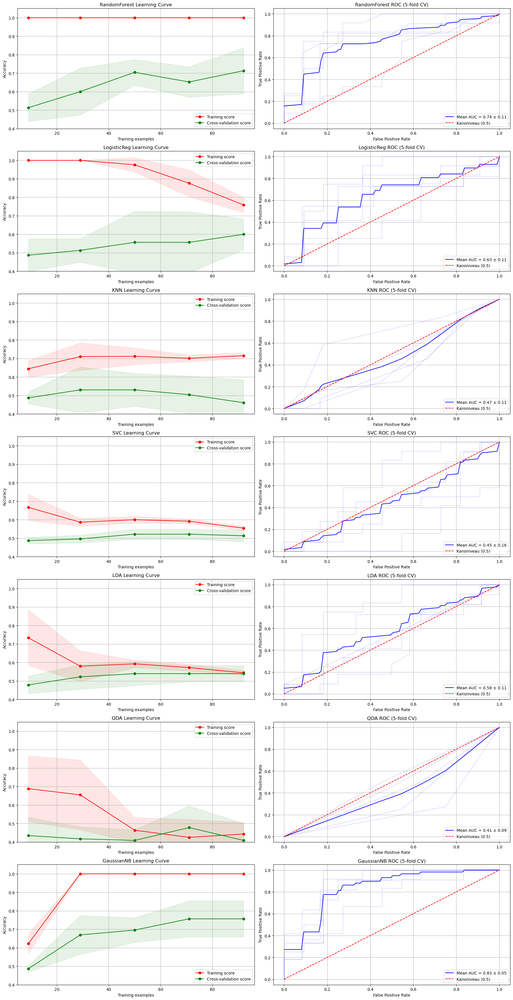

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

    # 4. Pak de trainingsdata en stuur naar de 'n training' fase
    beste_model, naam, min_features_to_select = inner_loop(X_train_outer, y_train_outer)  
    # --- VISUALISATIE & FEATURE ANALYSE ---
    # 1. Haal de RFECV stap uit de pipeline
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # 2. Haal de namen van de features op
    # Eerst kijken we wat de VarianceCorrelationFilter doorliet
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Dan kijken we wat de RFECV daarvan heeft gekozen
    rfecv_mask = rfecv_stap.support_
    winnende_features = namen_na_filter[rfecv_mask]
    
    print(f"\n📊 Analyse Fold {i+1}:")
    print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
    print(f"Geselecteerde features: {winnende_features.tolist()}")

    # 3. De RFECV Grafiek (Score vs Aantal Features)
    plt.figure(figsize=(10, 5))
    # De x-as: van min_features tot totaal aantal geteste features
    x_range = range(rfecv_stap.min_features_to_select, 
                   len(rfecv_stap.cv_results_['mean_test_score']) + rfecv_stap.min_features_to_select)
    
    plt.plot(x_range, rfecv_stap.cv_results_['mean_test_score'], color='#2E86C1', lw=2, label='Gemiddelde Accuracy')
    
    # Voeg de standaarddeviatie toe als schaduw (geeft inzicht in stabiliteit)
    plt.fill_between(x_range, 
                     rfecv_stap.cv_results_['mean_test_score'] - rfecv_stap.cv_results_['std_test_score'],
                     rfecv_stap.cv_results_['mean_test_score'] + rfecv_stap.cv_results_['std_test_score'], 
                     alpha=0.2, color='#2E86C1')

    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} features)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
#     # --- NIEUW: Haal de winnaar en zijn instellingen op ---
#     # 1. De naam van de classifier (bijv. 'RandomForestClassifier')
#     clf_naam = type(beste_model.named_steps['clf']).__name__
    
#     # 2. De hyperparameters van alleen de classifier-stap
#     # We filteren de hele pipeline-lijst op alles wat met 'clf__' begint
#     alle_params = beste_model.get_params()
#     best_params_clf = {k.split('__')[1]: v for k, v in alle_params.items() if k.startswith('clf__')}
    
#     print(f"🏆 Winnaar Fold {i+1}: {clf_naam}")
#     print(f"⚙️ Instellingen: {best_params_clf}")
#     # -----------------------------------------------------

#     # De rest van je code...
#     data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names)
#     alle_analyse_data.append(data_fold)

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


> Best voor LogisticRegression: 0.6731
Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ValueError: not enough values to unpack (expected 3, got 2)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

    # 4. Pak de trainingsdata en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)  
    # --- VISUALISATIE & FEATURE ANALYSE ---
    # 1. Haal de RFECV stap uit de pipeline
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # 2. Haal de namen van de features op
    # Eerst kijken we wat de VarianceCorrelationFilter doorliet
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Dan kijken we wat de RFECV daarvan heeft gekozen
    rfecv_mask = rfecv_stap.support_
    winnende_features = namen_na_filter[rfecv_mask]
    
    print(f"\n📊 Analyse Fold {i+1}:")
    print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
    print(f"Geselecteerde features: {winnende_features.tolist()}")

    # 3. De RFECV Grafiek (Score vs Aantal Features)
    plt.figure(figsize=(10, 5))
    # De x-as: van min_features tot totaal aantal geteste features
    x_range = range(rfecv_stap.min_features_to_select, 
                   len(rfecv_stap.cv_results_['mean_test_score']) + rfecv_stap.min_features_to_select)
    
    plt.plot(x_range, rfecv_stap.cv_results_['mean_test_score'], color='#2E86C1', lw=2, label='Gemiddelde Accuracy')
    
    # Voeg de standaarddeviatie toe als schaduw (geeft inzicht in stabiliteit)
    plt.fill_between(x_range, 
                     rfecv_stap.cv_results_['mean_test_score'] - rfecv_stap.cv_results_['std_test_score'],
                     rfecv_stap.cv_results_['mean_test_score'] + rfecv_stap.cv_results_['std_test_score'], 
                     alpha=0.2, color='#2E86C1')

    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} features)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
#     # --- NIEUW: Haal de winnaar en zijn instellingen op ---
#     # 1. De naam van de classifier (bijv. 'RandomForestClassifier')
#     clf_naam = type(beste_model.named_steps['clf']).__name__
    
#     # 2. De hyperparameters van alleen de classifier-stap
#     # We filteren de hele pipeline-lijst op alles wat met 'clf__' begint
#     alle_params = beste_model.get_params()
#     best_params_clf = {k.split('__')[1]: v for k, v in alle_params.items() if k.startswith('clf__')}
    
#     print(f"🏆 Winnaar Fold {i+1}: {clf_naam}")
#     print(f"⚙️ Instellingen: {best_params_clf}")
#     # -----------------------------------------------------

#     # De rest van je code...
#     data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names)
#     alle_analyse_data.append(data_fold)

Klassen succesvol omgezet: {np.int64(0): np.int64(0), np.int64(1): np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731
Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KeyError: 'rfecv'

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

    # 4. Pak de trainingsdata en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)  
    # --- VISUALISATIE & FEATURE ANALYSE ---
    # 1. Haal de RFECV stap uit de pipeline
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # 2. Haal de namen van de features op
    # Eerst kijken we wat de VarianceCorrelationFilter doorliet
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Dan kijken we wat de RFECV daarvan heeft gekozen
    rfecv_mask = rfecv_stap.support_
    winnende_features = namen_na_filter[rfecv_mask]
    
    print(f"\n📊 Analyse Fold {i+1}:")
    print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
    print(f"Geselecteerde features: {winnende_features.tolist()}")

    # 3. De RFECV Grafiek (Score vs Aantal Features)
    plt.figure(figsize=(10, 5))
    # De x-as: van min_features tot totaal aantal geteste features
    x_range = range(rfecv_stap.min_features_to_select, 
                   len(rfecv_stap.cv_results_['mean_test_score']) + rfecv_stap.min_features_to_select)
    
    plt.plot(x_range, rfecv_stap.cv_results_['mean_test_score'], color='#2E86C1', lw=2, label='Gemiddelde Accuracy')
    
    # Voeg de standaarddeviatie toe als schaduw (geeft inzicht in stabiliteit)
    plt.fill_between(x_range, 
                     rfecv_stap.cv_results_['mean_test_score'] - rfecv_stap.cv_results_['std_test_score'],
                     rfecv_stap.cv_results_['mean_test_score'] + rfecv_stap.cv_results_['std_test_score'], 
                     alpha=0.2, color='#2E86C1')

    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} features)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
#     # --- NIEUW: Haal de winnaar en zijn instellingen op ---
#     # 1. De naam van de classifier (bijv. 'RandomForestClassifier')
#     clf_naam = type(beste_model.named_steps['clf']).__name__
    
#     # 2. De hyperparameters van alleen de classifier-stap
#     # We filteren de hele pipeline-lijst op alles wat met 'clf__' begint
#     alle_params = beste_model.get_params()
#     best_params_clf = {k.split('__')[1]: v for k, v in alle_params.items() if k.startswith('clf__')}
    
#     print(f"🏆 Winnaar Fold {i+1}: {clf_naam}")
#     print(f"⚙️ Instellingen: {best_params_clf}")
#     # -----------------------------------------------------

#     # De rest van je code...
#     data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names)
#     alle_analyse_data.append(data_fold)

Klassen succesvol omgezet: {np.int64(0): np.int64(0), np.int64(1): np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KeyError: 'rfecv'

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

    # 4. Pak de trainingsdata en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)  
    # --- VISUALISATIE & FEATURE ANALYSE ---
    # 1. Haal de RFECV stap uit de pipeline
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # 2. Haal de namen van de features op
    # Eerst kijken we wat de VarianceCorrelationFilter doorliet
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Dan kijken we wat de RFECV daarvan heeft gekozen
    rfecv_mask = rfecv_stap.support_
    winnende_features = namen_na_filter[rfecv_mask]
    
    print(f"\n📊 Analyse Fold {i+1}:")
    print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
    print(f"Geselecteerde features: {winnende_features.tolist()}")

    # 3. De RFECV Grafiek (Score vs Aantal Features)
    plt.figure(figsize=(10, 5))
    # De x-as: van min_features tot totaal aantal geteste features
    x_range = range(rfecv_stap.min_features_to_select, 
                   len(rfecv_stap.cv_results_['mean_test_score']) + rfecv_stap.min_features_to_select)
    
    plt.plot(x_range, rfecv_stap.cv_results_['mean_test_score'], color='#2E86C1', lw=2, label='Gemiddelde Accuracy')
    
    # Voeg de standaarddeviatie toe als schaduw (geeft inzicht in stabiliteit)
    plt.fill_between(x_range, 
                     rfecv_stap.cv_results_['mean_test_score'] - rfecv_stap.cv_results_['std_test_score'],
                     rfecv_stap.cv_results_['mean_test_score'] + rfecv_stap.cv_results_['std_test_score'], 
                     alpha=0.2, color='#2E86C1')

    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} features)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
#     # --- NIEUW: Haal de winnaar en zijn instellingen op ---
#     # 1. De naam van de classifier (bijv. 'RandomForestClassifier')
#     clf_naam = type(beste_model.named_steps['clf']).__name__
    
#     # 2. De hyperparameters van alleen de classifier-stap
#     # We filteren de hele pipeline-lijst op alles wat met 'clf__' begint
#     alle_params = beste_model.get_params()
#     best_params_clf = {k.split('__')[1]: v for k, v in alle_params.items() if k.startswith('clf__')}
    
#     print(f"🏆 Winnaar Fold {i+1}: {clf_naam}")
#     print(f"⚙️ Instellingen: {best_params_clf}")
#     # -----------------------------------------------------

#     # De rest van je code...
#     data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names)
#     alle_analyse_data.append(data_fold)

Klassen succesvol omgezet: {np.int64(0): np.int64(0), np.int64(1): np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KeyError: 'rfecv'

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


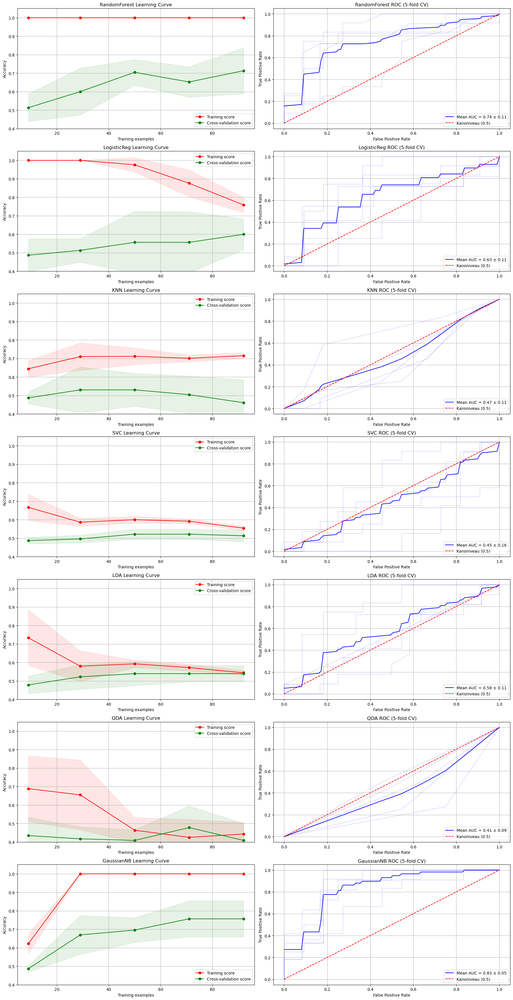

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

    # 4. Pak de trainingsdata en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)  
    # --- VISUALISATIE & FEATURE ANALYSE ---
    # 1. Haal de RFECV stap uit de pipeline
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # 2. Haal de namen van de features op
    # Eerst kijken we wat de VarianceCorrelationFilter doorliet
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Dan kijken we wat de RFECV daarvan heeft gekozen
    rfecv_mask = rfecv_stap.support_
    winnende_features = namen_na_filter[rfecv_mask]
    
    print(f"\n📊 Analyse Fold {i+1}:")
    print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
    print(f"Geselecteerde features: {winnende_features.tolist()}")

    # 3. De RFECV Grafiek (Score vs Aantal Features)
    plt.figure(figsize=(10, 5))
    # De x-as: van min_features tot totaal aantal geteste features
    x_range = range(rfecv_stap.min_features_to_select, 
                   len(rfecv_stap.cv_results_['mean_test_score']) + rfecv_stap.min_features_to_select)
    
    plt.plot(x_range, rfecv_stap.cv_results_['mean_test_score'], color='#2E86C1', lw=2, label='Gemiddelde Accuracy')
    
    # Voeg de standaarddeviatie toe als schaduw (geeft inzicht in stabiliteit)
    plt.fill_between(x_range, 
                     rfecv_stap.cv_results_['mean_test_score'] - rfecv_stap.cv_results_['std_test_score'],
                     rfecv_stap.cv_results_['mean_test_score'] + rfecv_stap.cv_results_['std_test_score'], 
                     alpha=0.2, color='#2E86C1')

    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} features)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
#     # --- NIEUW: Haal de winnaar en zijn instellingen op ---
#     # 1. De naam van de classifier (bijv. 'RandomForestClassifier')
#     clf_naam = type(beste_model.named_steps['clf']).__name__
    
#     # 2. De hyperparameters van alleen de classifier-stap
#     # We filteren de hele pipeline-lijst op alles wat met 'clf__' begint
#     alle_params = beste_model.get_params()
#     best_params_clf = {k.split('__')[1]: v for k, v in alle_params.items() if k.startswith('clf__')}
    
#     print(f"🏆 Winnaar Fold {i+1}: {clf_naam}")
#     print(f"⚙️ Instellingen: {best_params_clf}")
#     # -----------------------------------------------------

#     # De rest van je code...
#     data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names)
#     alle_analyse_data.append(data_fold)

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KeyError: 'rfecv'

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


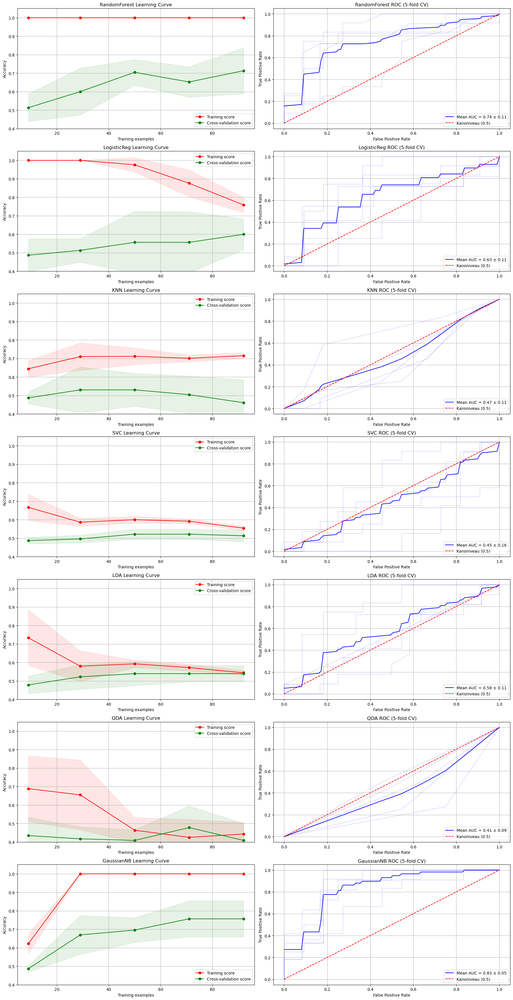

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

    # 4. Pak de trainingsdata en stuur naar de 'n training' fase
    # --- VISUALISATIE & FEATURE ANALYSE ---
    # 1. Haal de RFECV stap uit de pipeline
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # 2. Haal de namen van de features op
    # Eerst kijken we wat de VarianceCorrelationFilter doorliet
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Dan kijken we wat de RFECV daarvan heeft gekozen
    rfecv_mask = rfecv_stap.support_
    winnende_features = namen_na_filter[rfecv_mask]
    
    print(f"\n📊 Analyse Fold {i+1}:")
    print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
    print(f"Geselecteerde features: {winnende_features.tolist()}")

    # 3. De RFECV Grafiek (Score vs Aantal Features)
    plt.figure(figsize=(10, 5))
    # De x-as: van min_features tot totaal aantal geteste features
    # --- VISUALISATIE & FEATURE ANALYSE ---
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # Haal de scores op
    scores = rfecv_stap.cv_results_['mean_test_score']
    stds = rfecv_stap.cv_results_['std_test_score']
    
    # Belangrijk: De x-as moet exact matchen met de stappen van 10
    # We tellen terug vanaf het totaal aantal features na de filter
    n_features_start = len(namen_na_filter)
    step_size = rfecv_stap.step
    
    # Maak de x-as op basis van de werkelijke geteste aantallen
    x_range = [n_features_start - (i * step_size) for i in range(len(scores))]
    x_range.reverse() # Zorg dat de grafiek van weinig naar veel features loopt
    
    plt.plot(x_range, rfecv_stap.cv_results_['mean_test_score'], color='#2E86C1', lw=2, label='Gemiddelde Accuracy')
    
    # Voeg de standaarddeviatie toe als schaduw (geeft inzicht in stabiliteit)
    plt.fill_between(x_range, 
                     rfecv_stap.cv_results_['mean_test_score'] - rfecv_stap.cv_results_['std_test_score'],
                     rfecv_stap.cv_results_['mean_test_score'] + rfecv_stap.cv_results_['std_test_score'], 
                     alpha=0.2, color='#2E86C1')

    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} features)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
#     # --- NIEUW: Haal de winnaar en zijn instellingen op ---
#     # 1. De naam van de classifier (bijv. 'RandomForestClassifier')
#     clf_naam = type(beste_model.named_steps['clf']).__name__
    
#     # 2. De hyperparameters van alleen de classifier-stap
#     # We filteren de hele pipeline-lijst op alles wat met 'clf__' begint
#     alle_params = beste_model.get_params()
#     best_params_clf = {k.split('__')[1]: v for k, v in alle_params.items() if k.startswith('clf__')}
    
#     print(f"🏆 Winnaar Fold {i+1}: {clf_naam}")
#     print(f"⚙️ Instellingen: {best_params_clf}")
#     # -----------------------------------------------------

#     # De rest van je code...
#     data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names)
#     alle_analyse_data.append(data_fold)

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731
Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KeyError: 'rfecv'

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


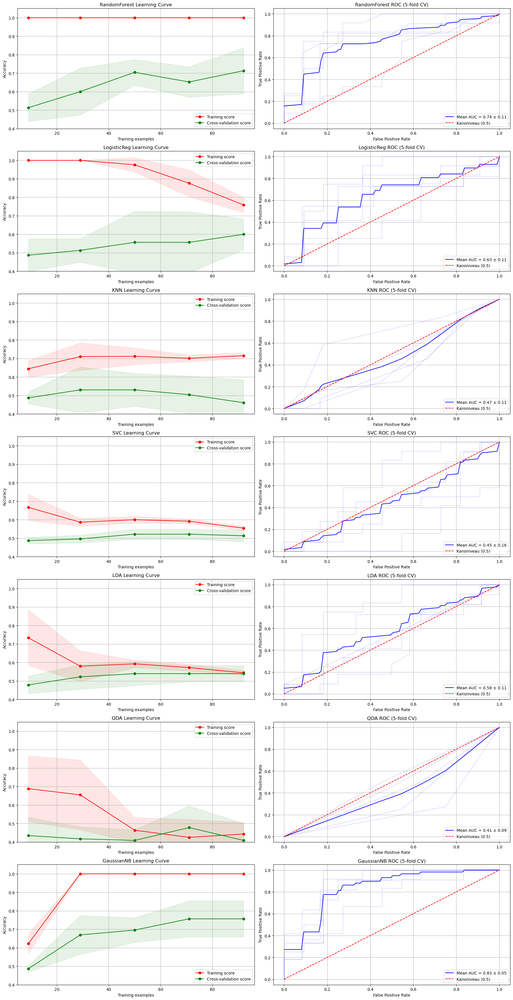

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

    # 4. Pak de trainingsdata en stuur naar de 'n training' fase
    # --- VISUALISATIE & FEATURE ANALYSE ---
    # 1. Haal de RFECV stap uit de pipeline
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # 2. Haal de namen van de features op
    # Eerst kijken we wat de VarianceCorrelationFilter doorliet
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Dan kijken we wat de RFECV daarvan heeft gekozen
    rfecv_mask = rfecv_stap.support_
    winnende_features = namen_na_filter[rfecv_mask]
    
    print(f"\n📊 Analyse Fold {i+1}:")
    print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
    print(f"Geselecteerde features: {winnende_features.tolist()}")

    # 3. De RFECV Grafiek (Score vs Aantal Features)
    plt.figure(figsize=(10, 5))
    # De x-as: van min_features tot totaal aantal geteste features

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731
Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KeyError: 'rfecv'

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


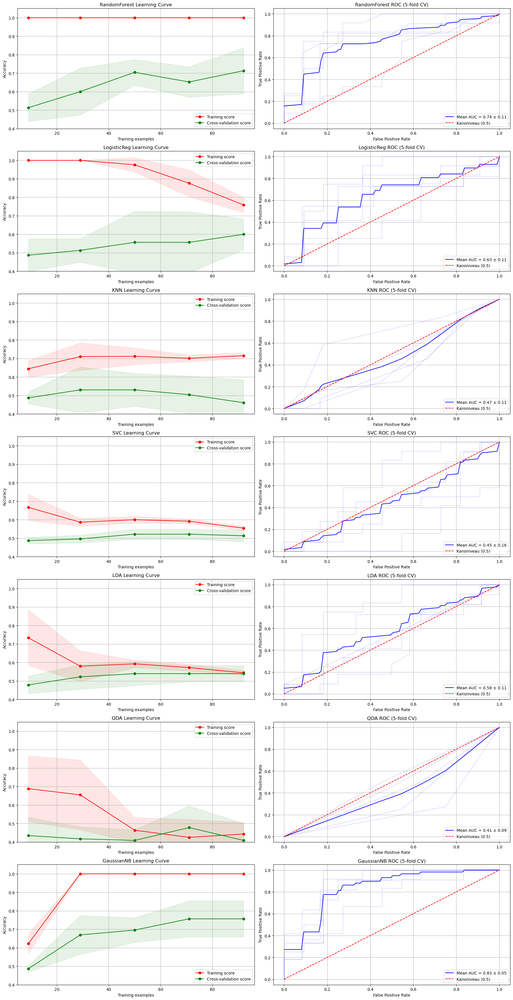

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%

--- Fold 2---
Train n=92, Test n=23
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor RandomForest: 0.7053
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor LogisticRegression: 0.5304


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold 2 - Train Acc: 100.00%
Fold 2 - Test Acc: 73.91%

--- Fold 3---
Train n=92, Test n=23
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor RandomForest: 0.6942
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


> Best voor LogisticRegression: 0.6070
Fold 3 - Train Acc: 100.00%
Fold 3 - Test Acc: 73.91%

--- Fold 4---
Train n=92, Test n=23
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor RandomForest: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6199
Fold 4 - Train Acc: 100.00%
Fold 4 - Test Acc: 65.22%

--- Fold 5---
Train n=92, Test n=23
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor RandomForest: 0.6819
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor LogisticRegression: 0.6503
Fold 5 - Train Acc: 100.00%
Fold 5 - Test Acc: 65.22%


In [ ]:
rfecv_stap = beste_model.named_steps['rfecv']

# Haal de scores op
scores = rfecv_stap.cv_results_['mean_test_score']
stds = rfecv_stap.cv_results_['std_test_score']

# Belangrijk: De x-as moet exact matchen met de stappen van 10
# We tellen terug vanaf het totaal aantal features na de filter
n_features_start = len(namen_na_filter)
step_size = rfecv_stap.step

# Maak de x-as op basis van de werkelijke geteste aantallen
x_range = [n_features_start - (i * step_size) for i in range(len(scores))]
x_range.reverse() # Zorg dat de grafiek van weinig naar veel features loopt

plt.plot(x_range, rfecv_stap.cv_results_['mean_test_score'], color='#2E86C1', lw=2, label='Gemiddelde Accuracy')

# Voeg de standaarddeviatie toe als schaduw (geeft inzicht in stabiliteit)
plt.fill_between(x_range, 
                 rfecv_stap.cv_results_['mean_test_score'] - rfecv_stap.cv_results_['std_test_score'],
                 rfecv_stap.cv_results_['mean_test_score'] + rfecv_stap.cv_results_['std_test_score'], 
                 alpha=0.2, color='#2E86C1')

plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} features)')

plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
plt.xlabel("Aantal geselecteerde Radiomics Features")
plt.ylabel("Cross-Validation Score")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

KeyError: 'rfecv'

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


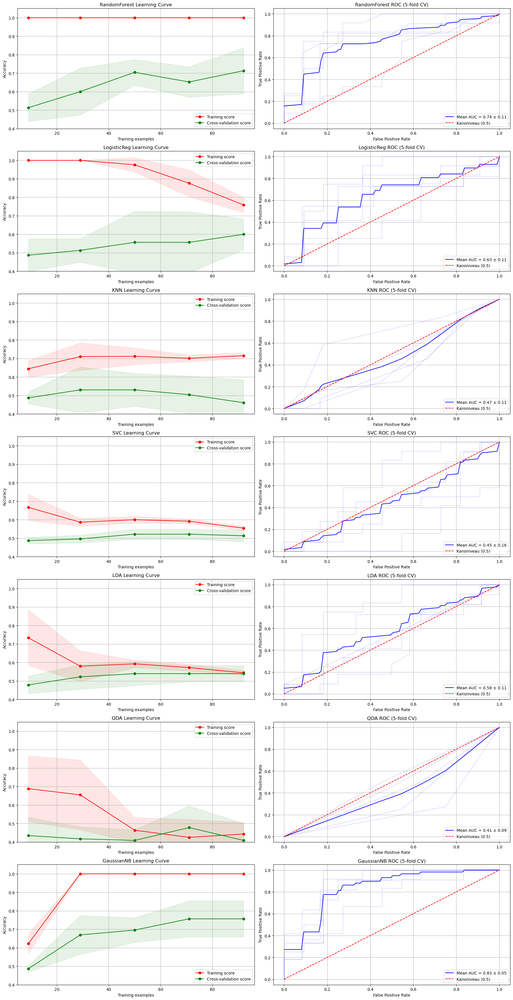

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%

--- Fold 2---
Train n=92, Test n=23
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor RandomForest: 0.7053
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor LogisticRegression: 0.5304


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold 2 - Train Acc: 100.00%
Fold 2 - Test Acc: 73.91%

--- Fold 3---
Train n=92, Test n=23
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor RandomForest: 0.6942
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


> Best voor LogisticRegression: 0.6070
Fold 3 - Train Acc: 100.00%
Fold 3 - Test Acc: 73.91%

--- Fold 4---
Train n=92, Test n=23
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor RandomForest: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6199
Fold 4 - Train Acc: 100.00%
Fold 4 - Test Acc: 65.22%

--- Fold 5---
Train n=92, Test n=23
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor RandomForest: 0.6819
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor LogisticRegression: 0.6503
Fold 5 - Train Acc: 100.00%
Fold 5 - Test Acc: 65.22%


In [ ]:
# Fail-safe: Check wat er in het model zit
print(f"Stappen in model: {beste_model.named_steps.keys()}")

if 'rfecv' in beste_model.named_steps:
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # We hebben namen_na_filter nodig voor de x-as berekening
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Haal de scores op
    scores = rfecv_stap.cv_results_['mean_test_score']
    stds = rfecv_stap.cv_results_['std_test_score']
    
    # Dynamische x-as bepalen
    n_final = len(scores)
    # We maken een x-as die loopt van het totaal aantal features terug naar het minimum
    x_range = np.linspace(rfecv_stap.min_features_to_select, 
                          rfecv_stap.min_features_to_select + (n_final-1) * rfecv_stap.step, 
                          n_final)

    plt.figure(figsize=(10, 5))
    plt.plot(x_range, scores, color='#2E86C1', lw=2, label='Mean Accuracy', marker='o', markersize=4)
    plt.fill_between(x_range, scores - stds, scores + stds, alpha=0.2, color='#2E86C1')
    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} f)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    print(f"✅ Fold {i+1} visualisatie voltooid.")
else:
    print("❌ FOUT: 'rfecv' stap niet gevonden in de pipeline stappen!")

Stappen in model: dict_keys(['imputer', 'feature_filter', 'scaler', 'clf'])
❌ FOUT: 'rfecv' stap niet gevonden in de pipeline stappen!


In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


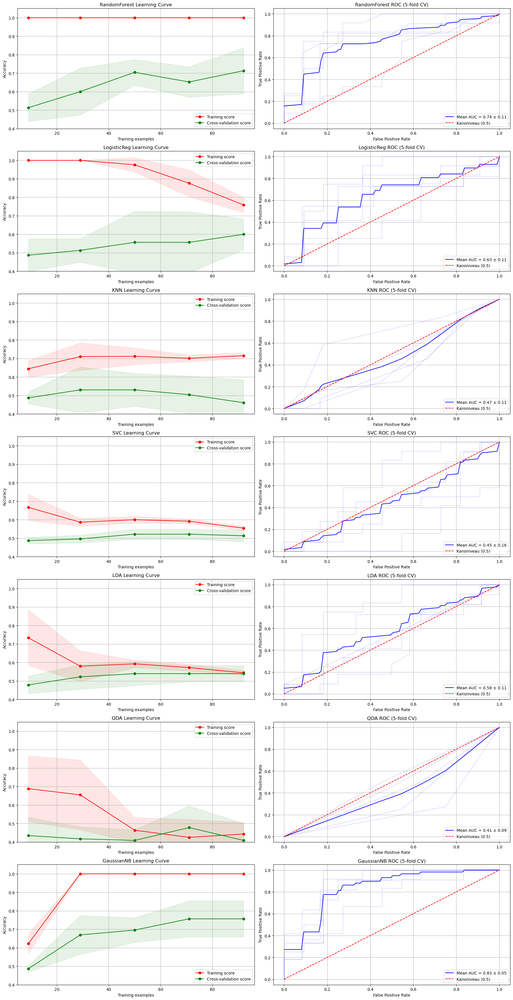

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor RandomForest: 0.6497
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6731
Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 56.52%

--- Fold 2---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor RandomForest: 0.7053
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor LogisticRegression: 0.5304
Fold 2 - Train Acc: 100.00%
Fold 2 - Test Acc: 73.91%

--- Fold 3---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor RandomForest: 0.6942
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6070


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold 3 - Train Acc: 100.00%
Fold 3 - Test Acc: 73.91%

--- Fold 4---
Train n=92, Test n=23
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor RandomForest: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6199
Fold 4 - Train Acc: 100.00%
Fold 4 - Test Acc: 65.22%

--- Fold 5---
Train n=92, Test n=23
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor RandomForest: 0.6819
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor LogisticRegression: 0.6503
Fold 5 - Train Acc: 100.00%
Fold 5 - Test Acc: 65.22%


In [ ]:
# Fail-safe: Check wat er in het model zit
print(f"Stappen in model: {beste_model.named_steps.keys()}")

if 'rfecv' in beste_model.named_steps:
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # We hebben namen_na_filter nodig voor de x-as berekening
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Haal de scores op
    scores = rfecv_stap.cv_results_['mean_test_score']
    stds = rfecv_stap.cv_results_['std_test_score']
    
    # Dynamische x-as bepalen
    n_final = len(scores)
    # We maken een x-as die loopt van het totaal aantal features terug naar het minimum
    x_range = np.linspace(rfecv_stap.min_features_to_select, 
                          rfecv_stap.min_features_to_select + (n_final-1) * rfecv_stap.step, 
                          n_final)

    plt.figure(figsize=(10, 5))
    plt.plot(x_range, scores, color='#2E86C1', lw=2, label='Mean Accuracy', marker='o', markersize=4)
    plt.fill_between(x_range, scores - stds, scores + stds, alpha=0.2, color='#2E86C1')
    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} f)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    print(f"✅ Fold {i+1} visualisatie voltooid.")
else:
    print("❌ FOUT: 'rfecv' stap niet gevonden in de pipeline stappen!")

Stappen in model: dict_keys(['imputer', 'feature_filter', 'scaler', 'clf'])
❌ FOUT: 'rfecv' stap niet gevonden in de pipeline stappen!


Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


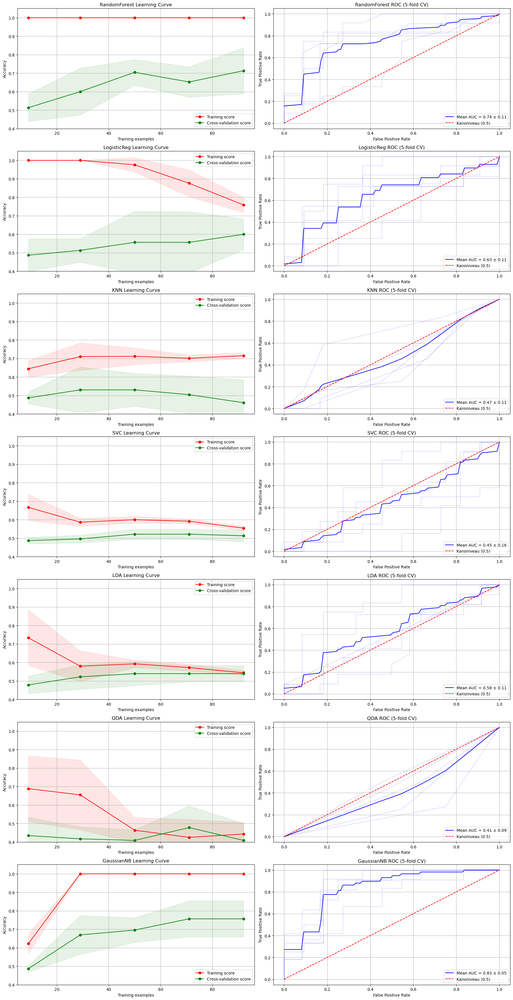

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7819
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6725
Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 52.17%

--- Fold 2---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7158
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor LogisticRegression: 0.6392
Fold 2 - Train Acc: 100.00%
Fold 2 - Test Acc: 69.57%

--- Fold 3---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7404
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6409
Fold 3 - Train Acc: 100.00%
Fold 3 - Test Acc: 73.91%

--- Fold 4---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6427
Fold 4 - Train Acc: 100.00%
Fold 4 - Test Acc: 73.91%

--- Fold 5---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7053
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor LogisticRegression: 0.6620
Fold 5 - Train Acc: 100.00%
Fold 5 - Test Acc: 73.91%


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

In [ ]:
# Fail-safe: Check wat er in het model zit
print(f"Stappen in model: {beste_model.named_steps.keys()}")

if 'rfecv' in beste_model.named_steps:
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # We hebben namen_na_filter nodig voor de x-as berekening
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Haal de scores op
    scores = rfecv_stap.cv_results_['mean_test_score']
    stds = rfecv_stap.cv_results_['std_test_score']
    
    # Dynamische x-as bepalen
    n_final = len(scores)
    # We maken een x-as die loopt van het totaal aantal features terug naar het minimum
    x_range = np.linspace(rfecv_stap.min_features_to_select, 
                          rfecv_stap.min_features_to_select + (n_final-1) * rfecv_stap.step, 
                          n_final)

    plt.figure(figsize=(10, 5))
    plt.plot(x_range, scores, color='#2E86C1', lw=2, label='Mean Accuracy', marker='o', markersize=4)
    plt.fill_between(x_range, scores - stds, scores + stds, alpha=0.2, color='#2E86C1')
    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} f)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    print(f"✅ Fold {i+1} visualisatie voltooid.")
else:
    print("❌ FOUT: 'rfecv' stap niet gevonden in de pipeline stappen!")

Stappen in model: dict_keys(['imputer', 'feature_filter', 'scaler', 'rfecv', 'clf'])


AttributeError: 'VarianceCorrelationFilter' object has no attribute 'get_support'

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


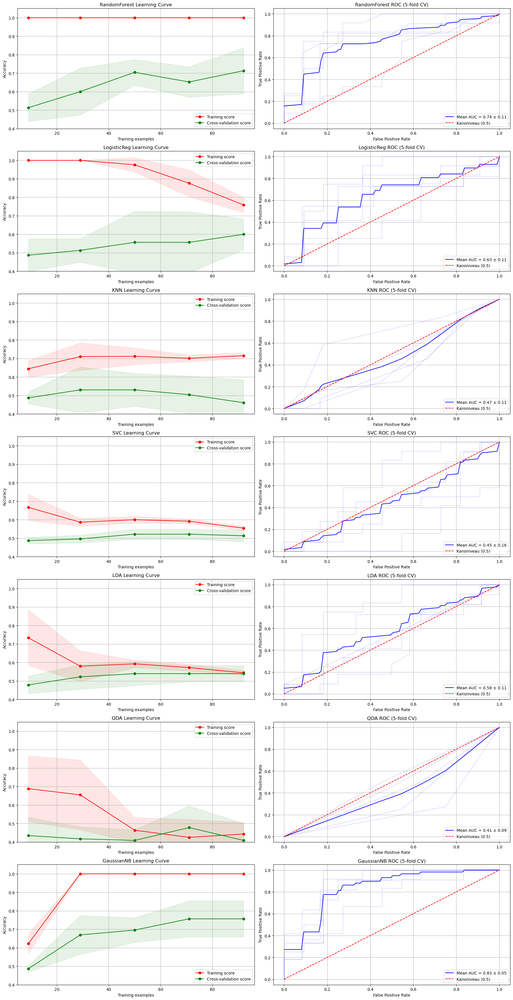

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print (f"\n--- Fold {i+1}---")

    #Data ophalen
    X_train_outer = pakketje['X_train']
    X_test_outer = pakketje['X_test']
    y_train_outer = pakketje['y_train']
    y_test_outer = pakketje['y_test']

    print(f"Train n={len(X_train_outer)}, Test n={len(X_test_outer)}")

    # 4. Pak de trainingsdata (92 samples) en stuur naar de 'n training' fase
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)
    # Verander dit (regel 25-28 in je code):
    data_fold = resultaten(beste_model, 
                           X_train_outer, y_train_outer, # Deel 1: Train
                           X_test_outer, y_test_outer,   # Deel 2: Test
                           feature_names, naam)                # Deel 3: Namen
    
    # Voeg toe aan onze grote lijst voor de finale analyse
    alle_analyse_data.append(data_fold)

    # HIER behoud je de zichtbare output per fold:
    print(f"Fold {i+1} - Train Acc: {data_fold['train_acc']:.2%}")
    print(f"Fold {i+1} - Test Acc: {data_fold['test_acc']:.2%}")
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Train n=92, Test n=23
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7819
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6725
Fold 1 - Train Acc: 100.00%
Fold 1 - Test Acc: 52.17%

--- Fold 2---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7158
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor LogisticRegression: 0.6392
Fold 2 - Train Acc: 100.00%
Fold 2 - Test Acc: 69.57%

--- Fold 3---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7404
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6409
Fold 3 - Train Acc: 100.00%
Fold 3 - Test Acc: 73.91%

--- Fold 4---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6427
Fold 4 - Train Acc: 100.00%
Fold 4 - Test Acc: 73.91%

--- Fold 5---
Train n=92, Test n=23


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7053
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor LogisticRegression: 0.6620
Fold 5 - Train Acc: 100.00%
Fold 5 - Test Acc: 73.91%


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

In [ ]:
# Fail-safe: Check wat er in het model zit
print(f"Stappen in model: {beste_model.named_steps.keys()}")

if 'rfecv' in beste_model.named_steps:
    rfecv_stap = beste_model.named_steps['rfecv']
    
    # We hebben namen_na_filter nodig voor de x-as berekening
    filter_mask = beste_model.named_steps['feature_filter'].get_support()
    namen_na_filter = X_train_outer.columns[filter_mask]
    
    # Haal de scores op
    scores = rfecv_stap.cv_results_['mean_test_score']
    stds = rfecv_stap.cv_results_['std_test_score']
    
    # Dynamische x-as bepalen
    n_final = len(scores)
    # We maken een x-as die loopt van het totaal aantal features terug naar het minimum
    x_range = np.linspace(rfecv_stap.min_features_to_select, 
                          rfecv_stap.min_features_to_select + (n_final-1) * rfecv_stap.step, 
                          n_final)

    plt.figure(figsize=(10, 5))
    plt.plot(x_range, scores, color='#2E86C1', lw=2, label='Mean Accuracy', marker='o', markersize=4)
    plt.fill_between(x_range, scores - stds, scores + stds, alpha=0.2, color='#2E86C1')
    plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', label=f'Optimum ({rfecv_stap.n_features_} f)')
    
    plt.title(f"Feature Selectie Curve - Fold {i+1} ({naam})")
    plt.xlabel("Aantal geselecteerde Radiomics Features")
    plt.ylabel("Cross-Validation Score")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    print(f"✅ Fold {i+1} visualisatie voltooid.")
else:
    print("❌ FOUT: 'rfecv' stap niet gevonden in de pipeline stappen!")

Stappen in model: dict_keys(['imputer', 'feature_filter', 'scaler', 'rfecv', 'clf'])


AttributeError: 'VarianceCorrelationFilter' object has no attribute 'get_support'

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


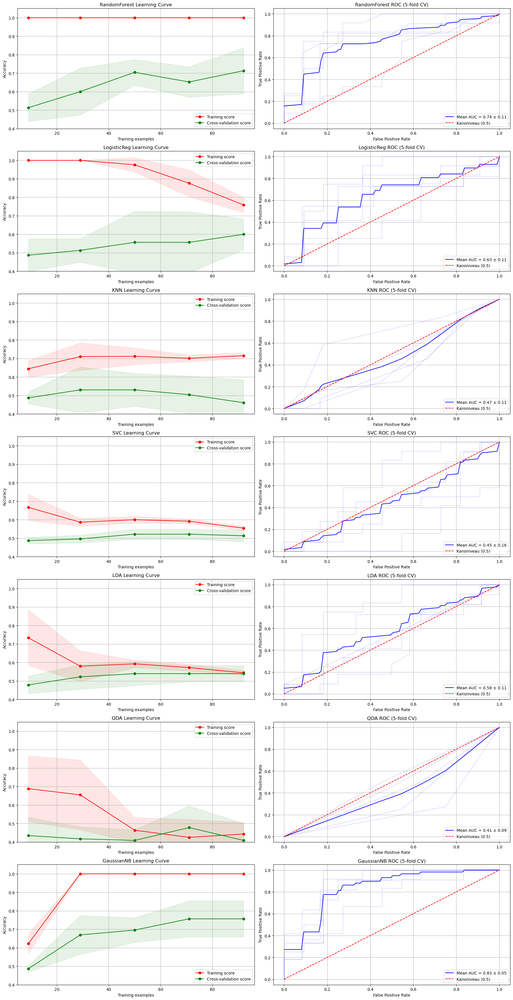

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

    # 3. RFECV Visualisatie (DIT IS HET STUKJE DAT JE ZOCHT)
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        
        # Haal de feature namen op na de eerste filter stap
        filter_mask = beste_model.named_steps['feature_filter'].get_support()
        namen_na_filter = X_train_outer.columns[filter_mask]
        
        # Welke zijn uiteindelijk gekozen?
        winnende_features = namen_na_filter[rfecv_stap.support_]
        print(f"✅ Optimaal aantal features: {rfecv_stap.n_features_}")
        print(f"📋 Geselecteerd: {winnende_features.tolist()[:5]}... (totaal {len(winnende_features)})")

        # Plotten
        plt.figure(figsize=(10, 5))
        scores = rfecv_stap.cv_results_['mean_test_score']
        
        # X-as berekenen op basis van de step=10
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (len(scores)-1) * rfecv_stap.step, 
                             len(scores))

        plt.plot(x_axis, scores, marker='o', label='Accuracy')
        plt.axvline(x=rfecv_stap.n_features_, color='r', linestyle='--', label='Optimum')
        plt.title(f"RFECV Optimalisatie - Fold {i+1} ({naam})")
        plt.xlabel("Aantal features")
        plt.ylabel("Score")
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.show()
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7819
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6725


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

AttributeError: 'VarianceCorrelationFilter' object has no attribute 'get_support'

Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


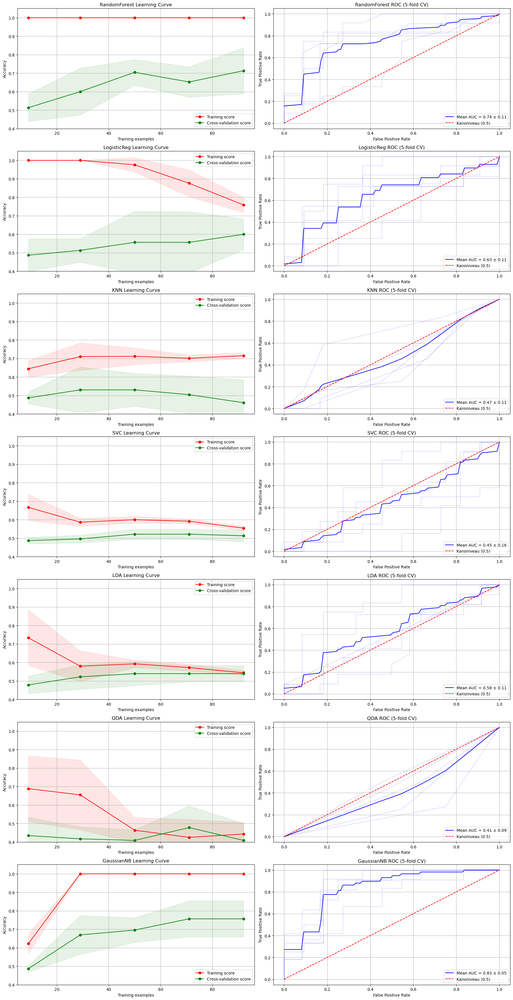

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

    # 3. RFECV Visualisatie (DIT IS HET STUKJE DAT JE ZOCHT)
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        
        # Haal de feature namen op na de eerste filter stap
        filter_mask = beste_model.named_steps['feature_filter'].get_support()
        namen_na_filter = X_train_outer.columns[filter_mask]
        
        # Welke zijn uiteindelijk gekozen?
        winnende_features = namen_na_filter[rfecv_stap.support_]
        print(f"✅ Optimaal aantal features: {rfecv_stap.n_features_}")
        print(f"📋 Geselecteerd: {winnende_features.tolist()[:5]}... (totaal {len(winnende_features)})")

        # Plotten
        plt.figure(figsize=(10, 5))
        scores = rfecv_stap.cv_results_['mean_test_score']
        
        # X-as berekenen op basis van de step=10
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (len(scores)-1) * rfecv_stap.step, 
                             len(scores))

        plt.plot(x_axis, scores, marker='o', label='Accuracy')
        plt.axvline(x=rfecv_stap.n_features_, color='r', linestyle='--', label='Optimum')
        plt.title(f"RFECV Optimalisatie - Fold {i+1} ({naam})")
        plt.xlabel("Aantal features")
        plt.ylabel("Score")
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.show()
    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7819
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6725


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

AttributeError: 'VarianceCorrelationFilter' object has no attribute 'get_support'

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

    # 3. RFECV Visualisatie (DIT IS HET STUKJE DAT JE ZOCHT)
 # --- VISUALISATIE & FEATURE ANALYSE ---
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        
        # 1. Haal de namen op die de RFECV-stap daadwerkelijk heeft gezien
        # Dit zijn de namen NA de VarianceCorrelationFilter
        namen_na_filter = rfecv_stap.feature_names_in_
        
        # 2. Welke zijn uiteindelijk door RFECV gekozen?
        rfecv_mask = rfecv_stap.support_
        winnende_features = namen_na_filter[rfecv_mask]
        
        print(f"\n✅ Analyse Fold {i+1}:")
        print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
        print(f"Geselecteerde features: {winnende_features.tolist()}")

        # 3. Het Plaatje (Score vs Aantal Features)
        scores = rfecv_stap.cv_results_['mean_test_score']
        stds = rfecv_stap.cv_results_['std_test_score']
        
        # Bereken de x-as op basis van de testpunten en de stapgrootte (10)
        n_punten = len(scores)
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (n_punten-1) * rfecv_stap.step, 
                             n_punten)

        plt.figure(figsize=(10, 5))
        plt.plot(x_axis, scores, color='#2E86C1', lw=2, marker='o', markersize=4, label='Mean Accuracy')
        plt.fill_between(x_axis, scores - stds, scores + stds, alpha=0.15, color='#2E86C1')
        
        plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', 
                    label=f'Optimum: {rfecv_stap.n_features_} f')
        
        plt.title(f"RFECV Optimalisatie Curve - Fold {i+1} ({naam})")
        plt.xlabel("Aantal geselecteerde Radiomics Features")
        plt.ylabel("Cross-Validation Score")
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show()    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Klassen succesvol omgezet: {np.int64(0): np.int64(0), np.int64(1): np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7819
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6725


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

AttributeError: 'RFECV' object has no attribute 'feature_names_in_'

Klassen succesvol omgezet: {np.int64(0): np.int64(0), np.int64(1): np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7819
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6725
⚠️ Kon namen niet matchen: Boolean index has wrong length: 165 instead of 493
Optimaal aantal features: 95


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

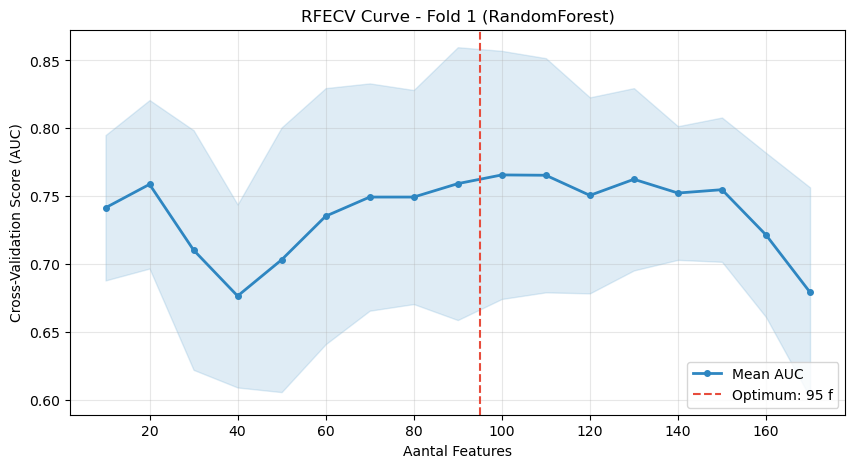


--- Fold 2---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor RandomForest: 0.7158


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor LogisticRegression: 0.6392
⚠️ Kon namen niet matchen: Boolean index has wrong length: 166 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

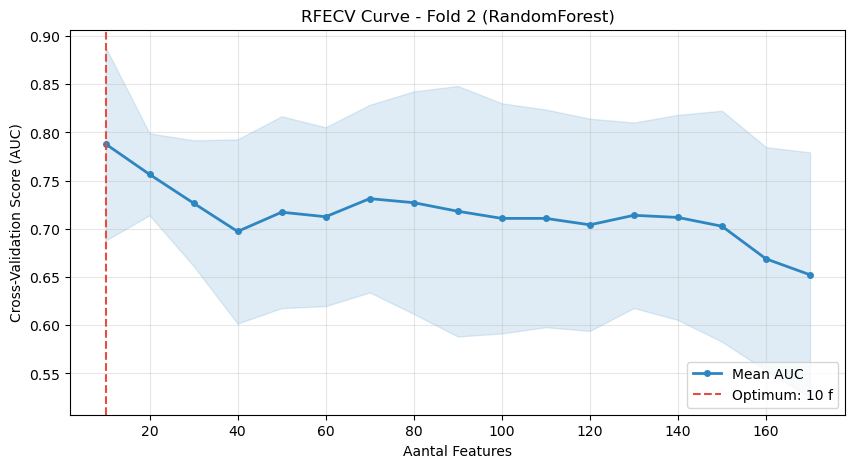


--- Fold 3---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7404
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6409
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

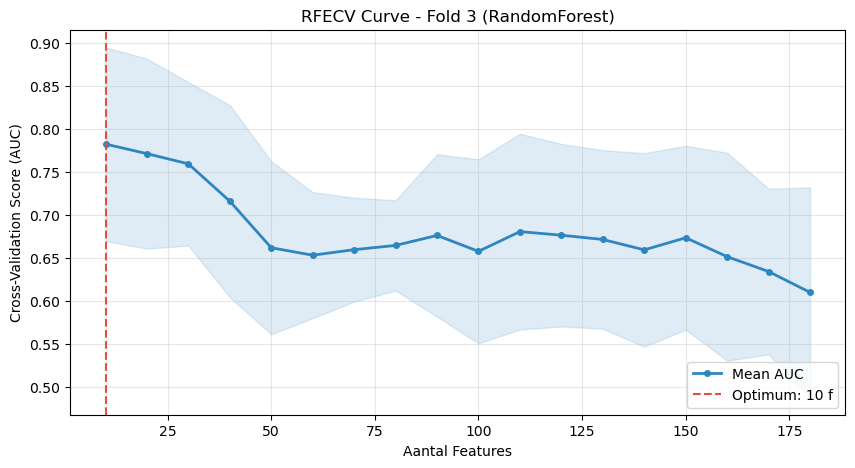


--- Fold 4---
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6427
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

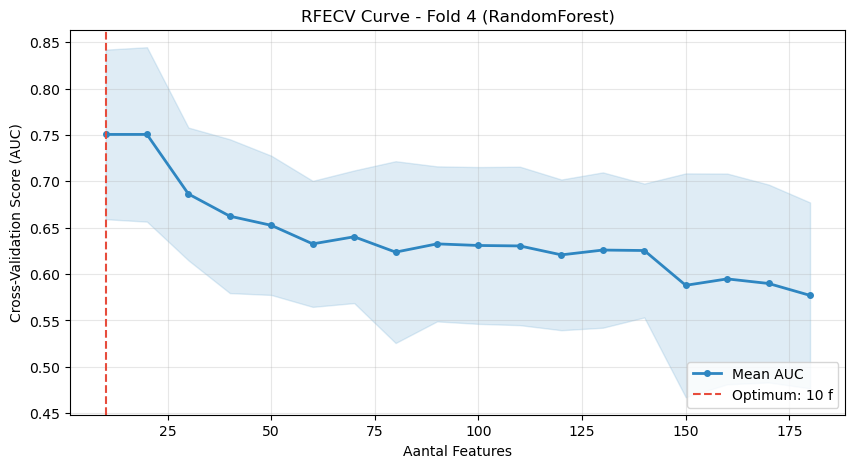


--- Fold 5---
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7053
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor LogisticRegression: 0.6620
⚠️ Kon namen niet matchen: Boolean index has wrong length: 167 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

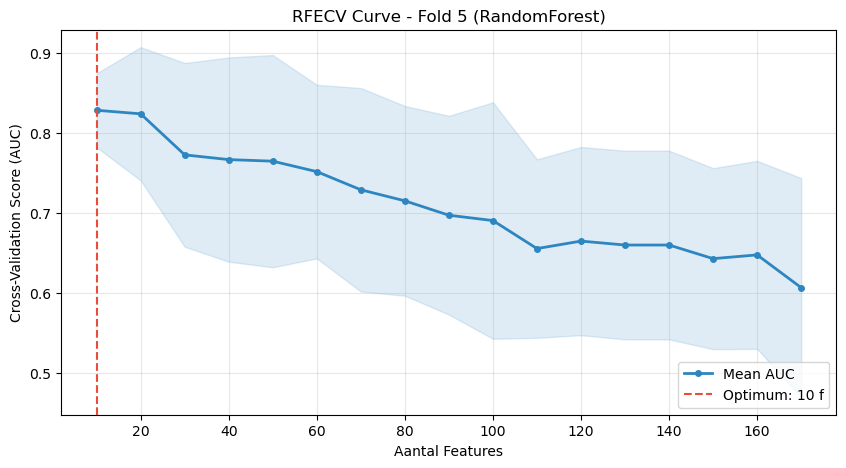

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

    # 3. RFECV Visualisatie (DIT IS HET STUKJE DAT JE ZOCHT)
 # --- VISUALISATIE & FEATURE ANALYSE ---
# --- VISUALISATIE & FEATURE ANALYSE ---
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        filter_stap = beste_model.named_steps['feature_filter']
        
        # 1. Haal de namen op na de eerste filter stap
        # We kijken direct in de 'columns_to_keep_' van jouw VarianceCorrelationFilter
        if hasattr(filter_stap, 'columns_to_keep_'):
            namen_na_filter = filter_stap.columns_to_keep_
        else:
            # Als dat niet werkt, gebruiken we de originele X_train kolommen 
            # (Let op: dit werkt alleen als de filter niks heeft weggegooid, 
            #  anders krijg je een lengte-fout)
            namen_na_filter = X_train_outer.columns

        # 2. Welke zijn uiteindelijk door RFECV gekozen?
        rfecv_mask = rfecv_stap.support_
        
        # Match de namen (we zorgen dat de lengte klopt om errors te voorkomen)
        try:
            winnende_features = namen_na_filter[rfecv_mask]
            print(f"\n✅ Analyse Fold {i+1}:")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
            print(f"Geselecteerde features: {winnende_features.tolist()}")
        except Exception as e:
            print(f"⚠️ Kon namen niet matchen: {e}")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")

        # 3. Het Plaatje (Score vs Aantal Features)
        scores = rfecv_stap.cv_results_['mean_test_score']
        stds = rfecv_stap.cv_results_['std_test_score']
        
        # Bereken de x-as op basis van de testpunten en de stapgrootte (10)
        n_punten = len(scores)
        # De x-as moet lopen van min_features_to_select tot het totaal aantal features
        # dat de RFECV heeft gezien (n_features_in_)
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (n_punten-1) * rfecv_stap.step, 
                             n_punten)

        plt.figure(figsize=(10, 5))
        plt.plot(x_axis, scores, color='#2E86C1', lw=2, marker='o', markersize=4, label='Mean AUC')
        plt.fill_between(x_axis, scores - stds, scores + stds, alpha=0.15, color='#2E86C1')
        
        plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', 
                    label=f'Optimum: {rfecv_stap.n_features_} f')
        
        plt.title(f"RFECV Curve - Fold {i+1} ({naam})")
        plt.xlabel("Aantal Features")
        plt.ylabel("Cross-Validation Score (AUC)")
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show()    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


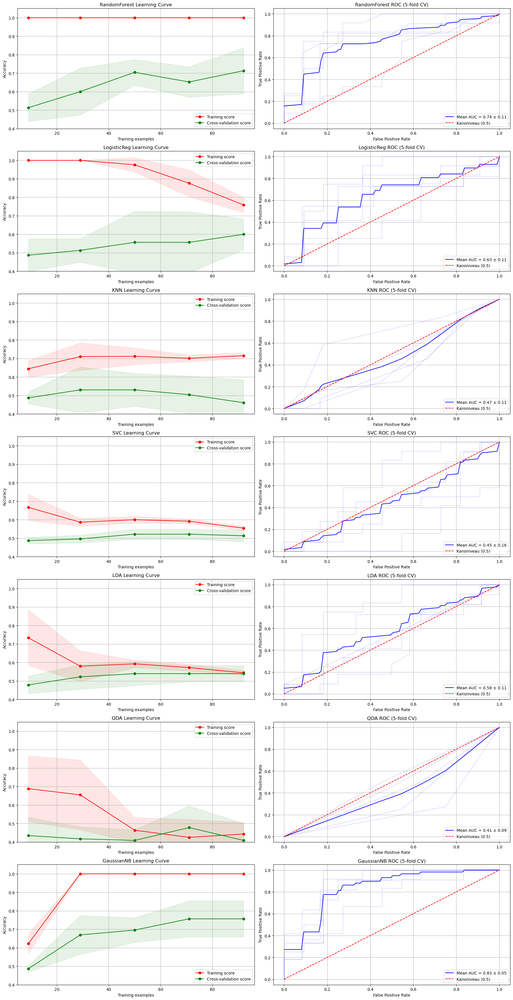

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7819
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6725
⚠️ Kon namen niet matchen: Boolean index has wrong length: 165 instead of 493
Optimaal aantal features: 95


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

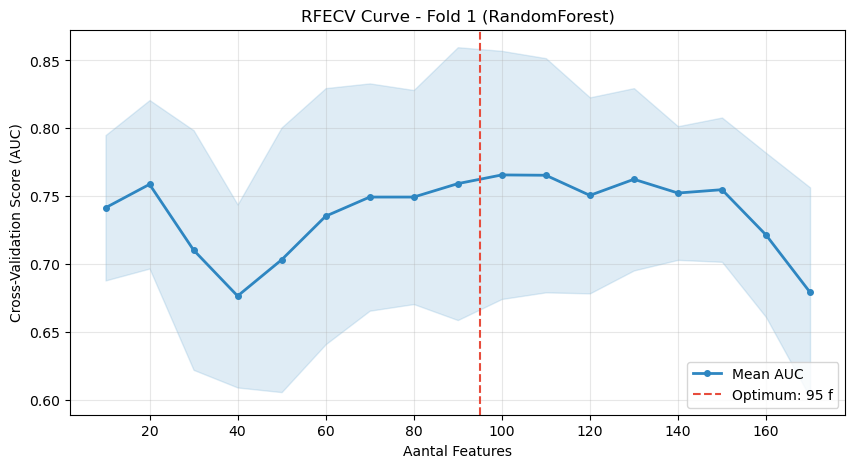


--- Fold 2---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7158
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor LogisticRegression: 0.6392
⚠️ Kon namen niet matchen: Boolean index has wrong length: 166 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

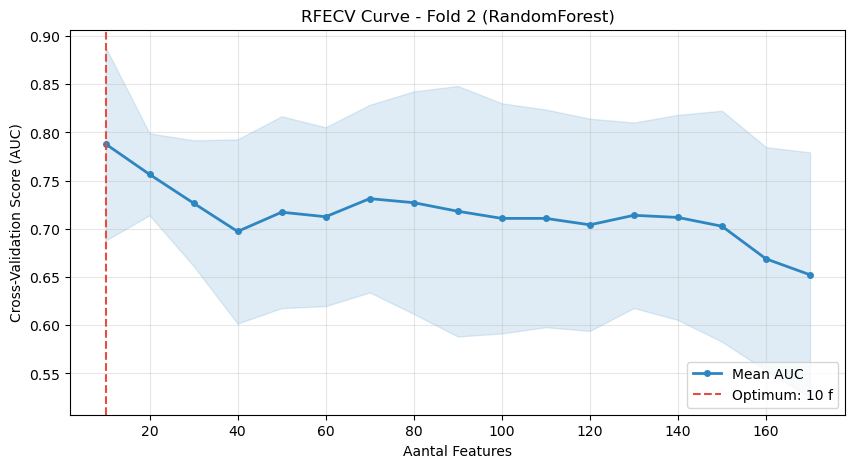


--- Fold 3---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7404
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6409
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

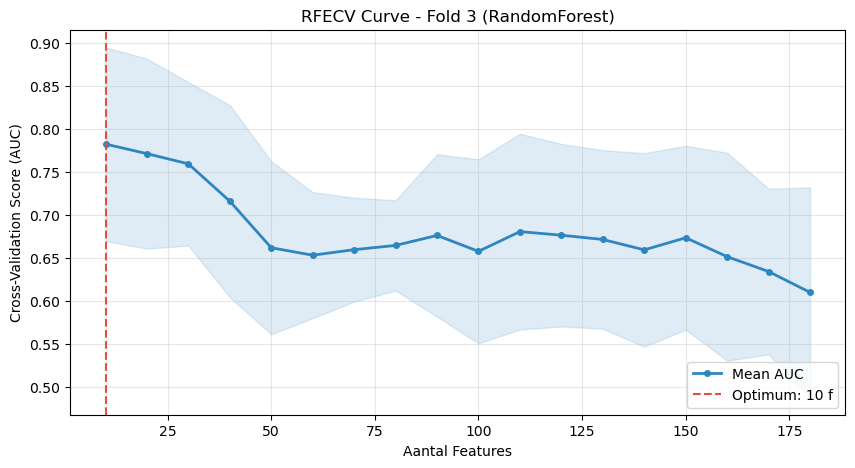


--- Fold 4---
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6427
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

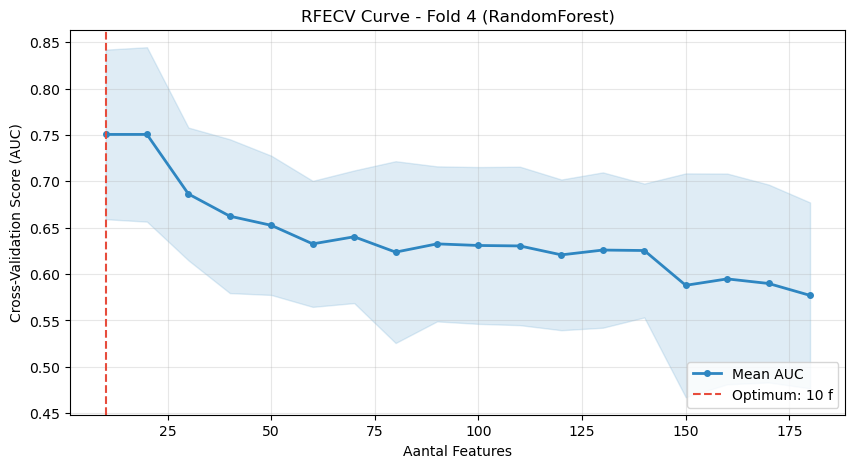


--- Fold 5---
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor RandomForest: 0.7053


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor LogisticRegression: 0.6620
⚠️ Kon namen niet matchen: Boolean index has wrong length: 167 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

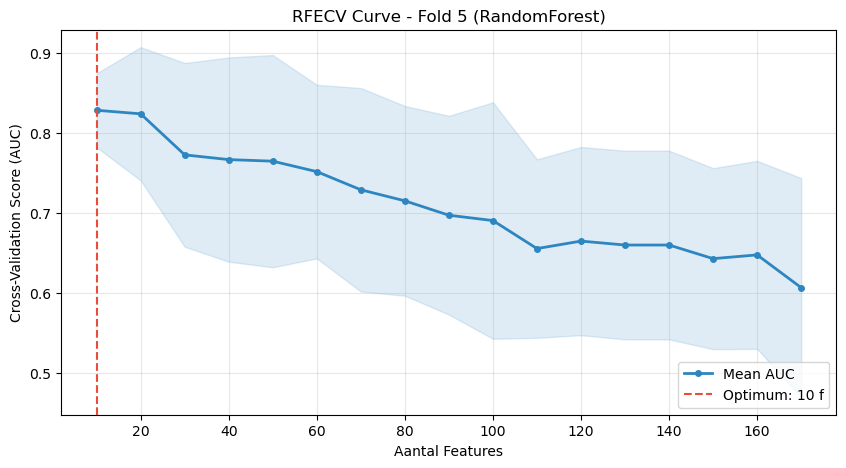

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

    # 3. RFECV Visualisatie (DIT IS HET STUKJE DAT JE ZOCHT)
 # --- VISUALISATIE & FEATURE ANALYSE ---
# --- VISUALISATIE & FEATURE ANALYSE ---
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        filter_stap = beste_model.named_steps['feature_filter']
        
        # 1. Haal de namen op na de eerste filter stap
        # We kijken direct in de 'columns_to_keep_' van jouw VarianceCorrelationFilter
        if hasattr(filter_stap, 'columns_to_keep_'):
            namen_na_filter = filter_stap.columns_to_keep_
        else:
            # Als dat niet werkt, gebruiken we de originele X_train kolommen 
            # (Let op: dit werkt alleen als de filter niks heeft weggegooid, 
            #  anders krijg je een lengte-fout)
            namen_na_filter = X_train_outer.columns

        # 2. Welke zijn uiteindelijk door RFECV gekozen?
        rfecv_mask = rfecv_stap.support_
        
        # Match de namen (we zorgen dat de lengte klopt om errors te voorkomen)
        try:
            winnende_features = namen_na_filter[rfecv_mask]
            print(f"\n✅ Analyse Fold {i+1}:")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
            print(f"Geselecteerde features: {winnende_features.tolist()}")
        except Exception as e:
            print(f"⚠️ Kon namen niet matchen: {e}")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")

        # 3. Het Plaatje (Score vs Aantal Features)
        scores = rfecv_stap.cv_results_['mean_test_score']
        stds = rfecv_stap.cv_results_['std_test_score']
        
        # Bereken de x-as op basis van de testpunten en de stapgrootte (10)
        n_punten = len(scores)
        # De x-as moet lopen van min_features_to_select tot het totaal aantal features
        # dat de RFECV heeft gezien (n_features_in_)
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (n_punten-1) * rfecv_stap.step, 
                             n_punten)

        plt.figure(figsize=(10, 5))
        plt.plot(x_axis, scores, color='#2E86C1', lw=2, marker='o', markersize=4, label='Mean AUC')
        plt.fill_between(x_axis, scores - stds, scores + stds, alpha=0.15, color='#2E86C1')
        
        plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', 
                    label=f'Optimum: {rfecv_stap.n_features_} f')
        
        plt.title(f"RFECV Curve - Fold {i+1} ({naam})")
        plt.xlabel("Aantal Features")
        plt.ylabel("Cross-Validation Score (AUC)")
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show()    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


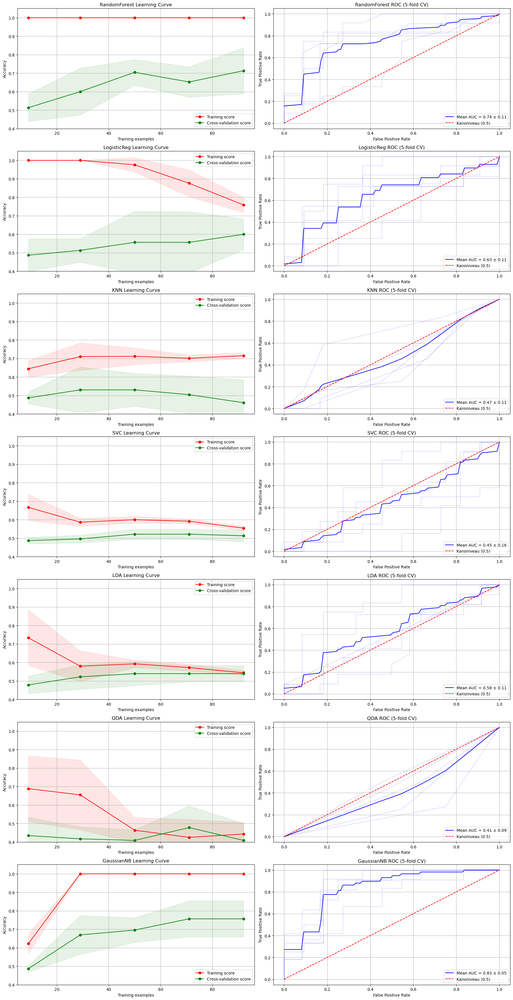

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7819
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering
> Best voor LogisticRegression: 0.6725
⚠️ Kon namen niet matchen: Boolean index has wrong length: 165 instead of 493
Optimaal aantal features: 95


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

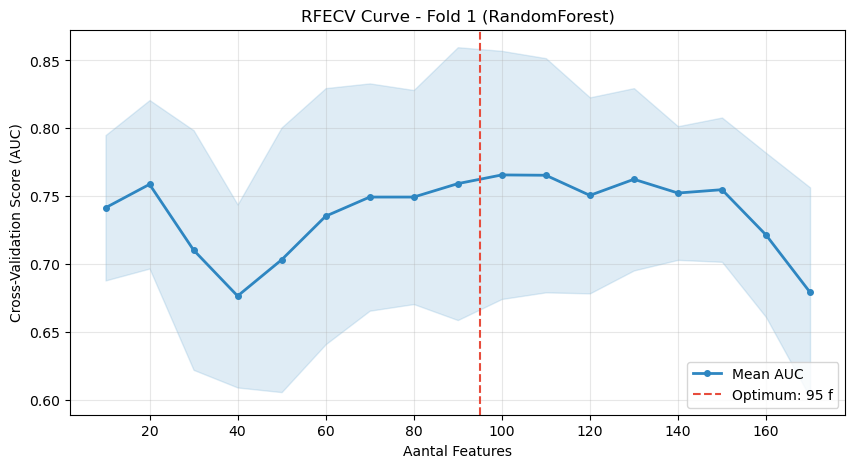


--- Fold 2---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7158
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering
> Best voor LogisticRegression: 0.6392
⚠️ Kon namen niet matchen: Boolean index has wrong length: 166 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

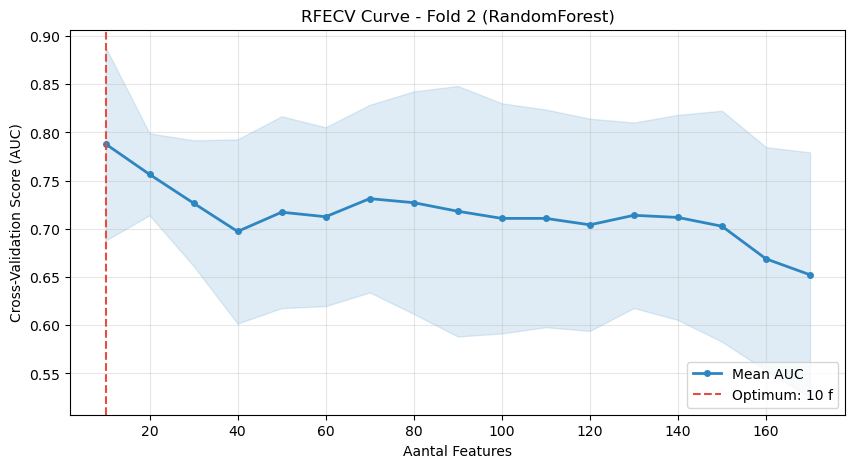


--- Fold 3---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7404
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6409
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

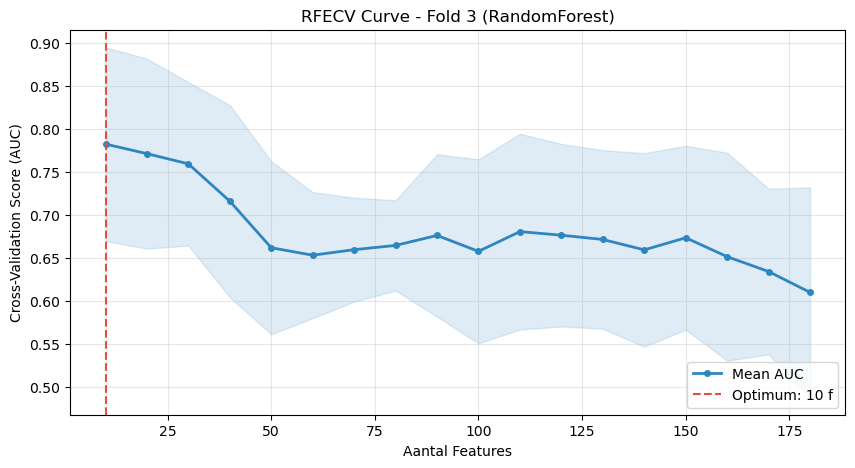


--- Fold 4---
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering
> Best voor LogisticRegression: 0.6427
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

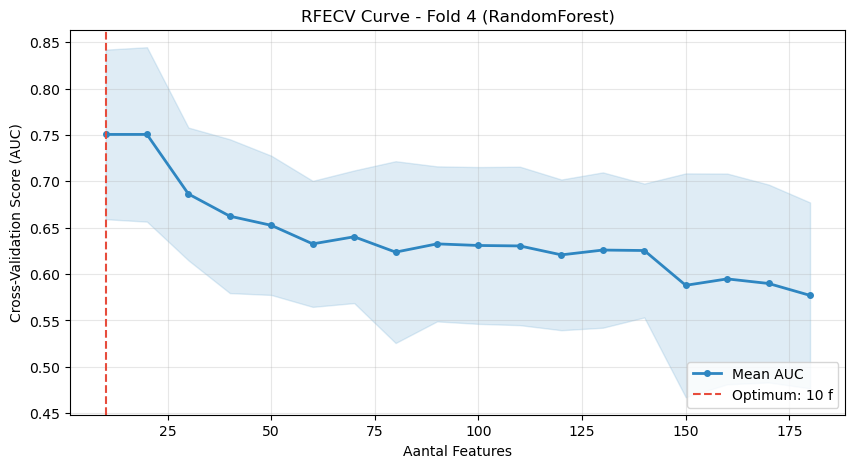


--- Fold 5---
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7053
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering
> Best voor LogisticRegression: 0.6620
⚠️ Kon namen niet matchen: Boolean index has wrong length: 167 instead of 493
Optimaal aantal features: 10


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

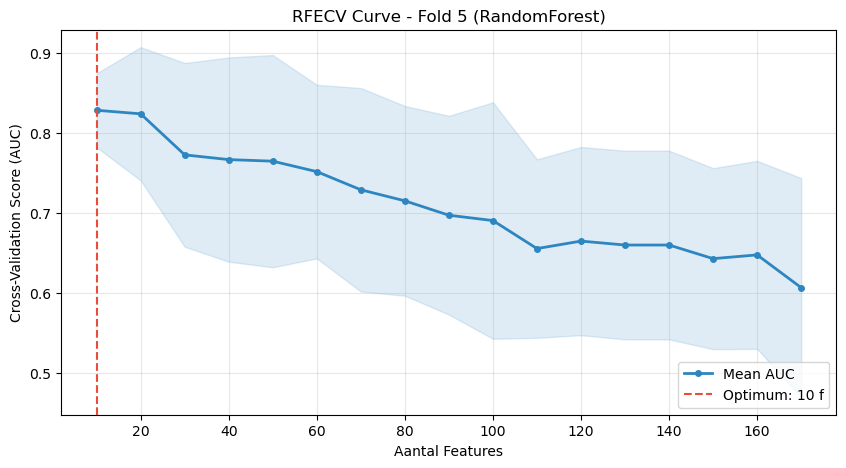

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

    # 3. RFECV Visualisatie (DIT IS HET STUKJE DAT JE ZOCHT)
 # --- VISUALISATIE & FEATURE ANALYSE ---
# --- VISUALISATIE & FEATURE ANALYSE ---
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        filter_stap = beste_model.named_steps['feature_filter']
        
        # 1. Haal de namen op na de eerste filter stap
        # We kijken direct in de 'columns_to_keep_' van jouw VarianceCorrelationFilter
        if hasattr(filter_stap, 'columns_to_keep_'):
            namen_na_filter = filter_stap.columns_to_keep_
        else:
            # Als dat niet werkt, gebruiken we de originele X_train kolommen 
            # (Let op: dit werkt alleen als de filter niks heeft weggegooid, 
            #  anders krijg je een lengte-fout)
            namen_na_filter = X_train_outer.columns

        # 2. Welke zijn uiteindelijk door RFECV gekozen?
        rfecv_mask = rfecv_stap.support_
        
        # Match de namen (we zorgen dat de lengte klopt om errors te voorkomen)
        try:
            winnende_features = namen_na_filter[rfecv_mask]
            print(f"\n✅ Analyse Fold {i+1}:")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
            print(f"Geselecteerde features: {winnende_features.tolist()}")
        except Exception as e:
            print(f"⚠️ Kon namen niet matchen: {e}")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")

        # 3. Het Plaatje (Score vs Aantal Features)
        scores = rfecv_stap.cv_results_['mean_test_score']
        stds = rfecv_stap.cv_results_['std_test_score']
        
        # Bereken de x-as op basis van de testpunten en de stapgrootte (10)
        n_punten = len(scores)
        # De x-as moet lopen van min_features_to_select tot het totaal aantal features
        # dat de RFECV heeft gezien (n_features_in_)
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (n_punten-1) * rfecv_stap.step, 
                             n_punten)

        plt.figure(figsize=(10, 5))
        plt.plot(x_axis, scores, color='#2E86C1', lw=2, marker='o', markersize=4, label='Mean AUC')
        plt.fill_between(x_axis, scores - stds, scores + stds, alpha=0.15, color='#2E86C1')
        
        plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', 
                    label=f'Optimum: {rfecv_stap.n_features_} f')
        
        plt.title(f"RFECV Curve - Fold {i+1} ({naam})")
        plt.xlabel("Aantal Features")
        plt.ylabel("Cross-Validation Score (AUC)")
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show()    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


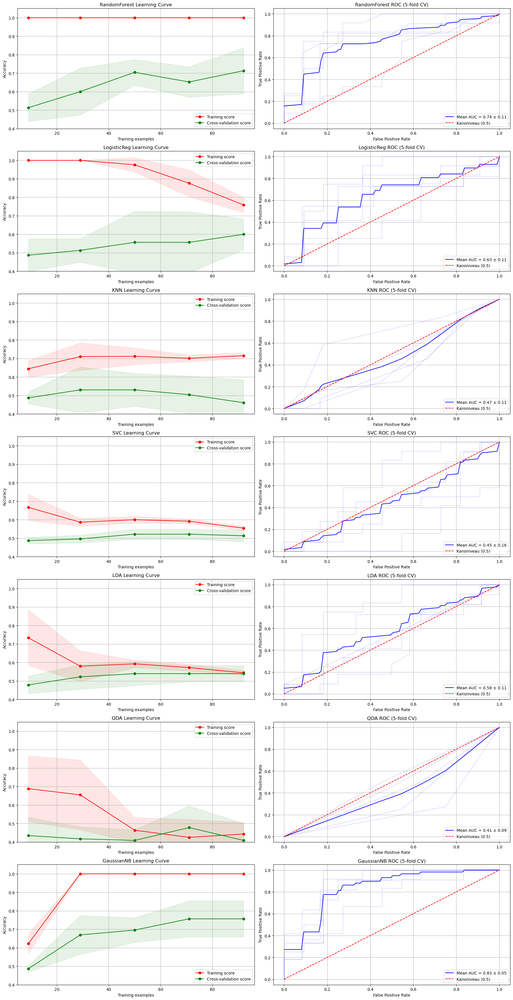

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7585
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.6491
⚠️ Kon namen niet matchen: Boolean index has wrong length: 165 instead of 493
Optimaal aantal features: 6


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

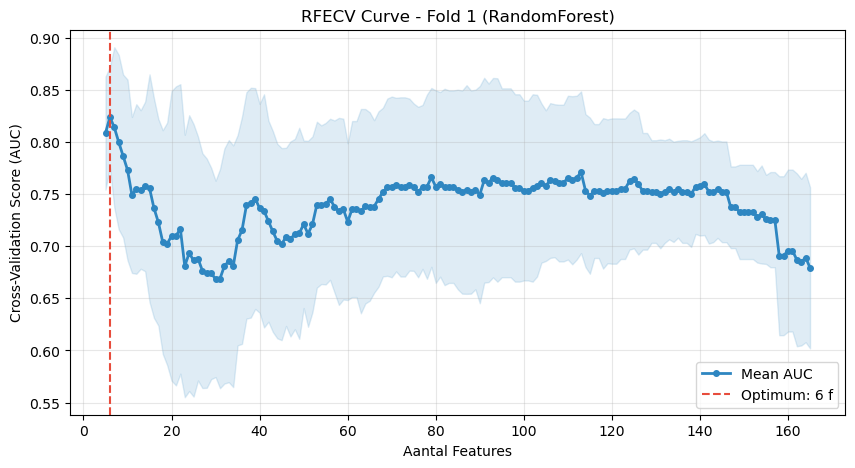


--- Fold 2---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7152
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.6819
⚠️ Kon namen niet matchen: Boolean index has wrong length: 166 instead of 493
Optimaal aantal features: 7


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

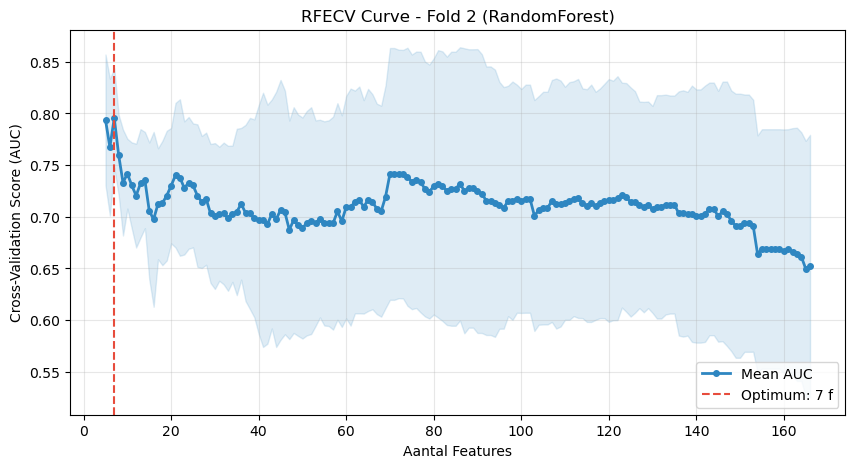


--- Fold 3---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.6971
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.6620
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 5


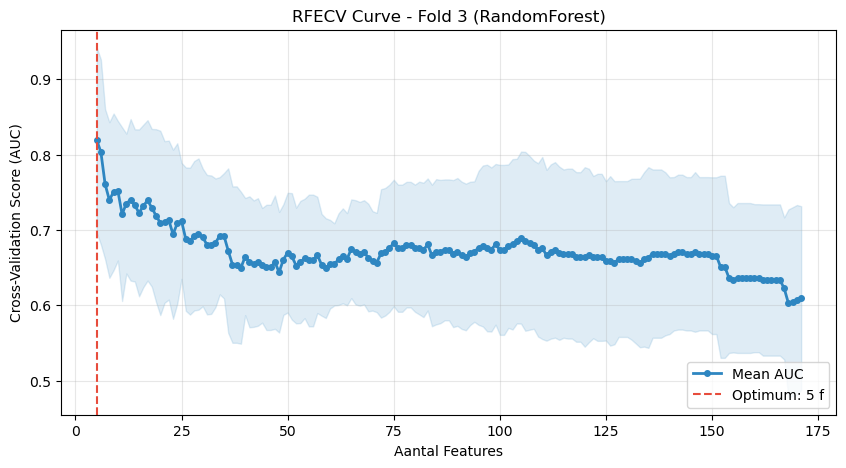


--- Fold 4---
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7398
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.6871
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 6


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

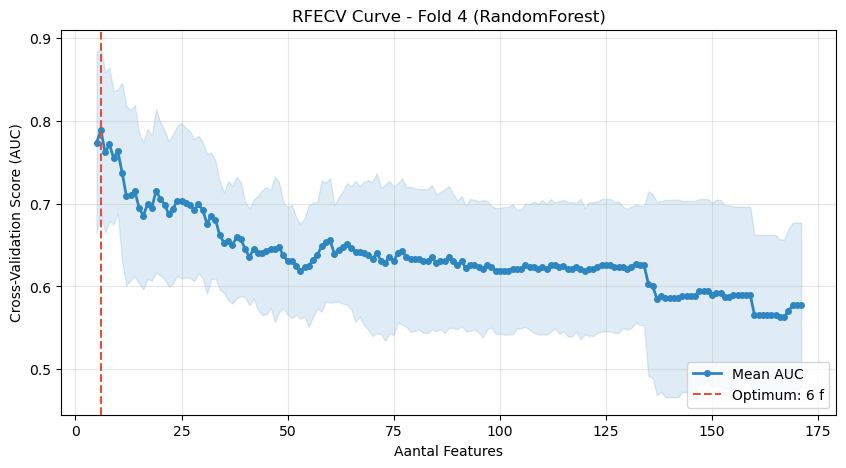


--- Fold 5---
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.6924


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

    # 3. RFECV Visualisatie (DIT IS HET STUKJE DAT JE ZOCHT)
 # --- VISUALISATIE & FEATURE ANALYSE ---
# --- VISUALISATIE & FEATURE ANALYSE ---
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        filter_stap = beste_model.named_steps['feature_filter']
        
        # 1. Haal de namen op na de eerste filter stap
        # We kijken direct in de 'columns_to_keep_' van jouw VarianceCorrelationFilter
        if hasattr(filter_stap, 'columns_to_keep_'):
            namen_na_filter = filter_stap.columns_to_keep_
        else:
            # Als dat niet werkt, gebruiken we de originele X_train kolommen 
            # (Let op: dit werkt alleen als de filter niks heeft weggegooid, 
            #  anders krijg je een lengte-fout)
            namen_na_filter = X_train_outer.columns

        # 2. Welke zijn uiteindelijk door RFECV gekozen?
        rfecv_mask = rfecv_stap.support_
        
        # Match de namen (we zorgen dat de lengte klopt om errors te voorkomen)
        try:
            winnende_features = namen_na_filter[rfecv_mask]
            print(f"\n✅ Analyse Fold {i+1}:")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
            print(f"Geselecteerde features: {winnende_features.tolist()}")
        except Exception as e:
            print(f"⚠️ Kon namen niet matchen: {e}")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")

        # 3. Het Plaatje (Score vs Aantal Features)
        scores = rfecv_stap.cv_results_['mean_test_score']
        stds = rfecv_stap.cv_results_['std_test_score']
        
        # Bereken de x-as op basis van de testpunten en de stapgrootte (10)
        n_punten = len(scores)
        # De x-as moet lopen van min_features_to_select tot het totaal aantal features
        # dat de RFECV heeft gezien (n_features_in_)
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (n_punten-1) * rfecv_stap.step, 
                             n_punten)

        plt.figure(figsize=(10, 5))
        plt.plot(x_axis, scores, color='#2E86C1', lw=2, marker='o', markersize=4, label='Mean AUC')
        plt.fill_between(x_axis, scores - stds, scores + stds, alpha=0.15, color='#2E86C1')
        
        plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', 
                    label=f'Optimum: {rfecv_stap.n_features_} f')
        
        plt.title(f"RFECV Curve - Fold {i+1} ({naam})")
        plt.xlabel("Aantal Features")
        plt.ylabel("Cross-Validation Score (AUC)")
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show()    #print(f"Fold {i+1} - AUC: {data_fold['auc']:.2f}")
    # Data verzamelen voor post-analyse
 #   score, imp = verzamel_resultaten(beste_model_fold, pakketje['X_test'], 
 #                                    pakketje['y_test'], feature_names)
 #   
 #   alle_scores.append(score)
 #   if imp is not None:
 #       alle_importances.append(imp)

  #  print(f"Score Fold {i+1}: {score:.3f}")
#if len(alle_analyse_data) == 5:
#    toon_vergelijking(alle_analyse_data)
#else:
#    print(f"WAARSCHUWING: Er zijn maar {len(alle_analyse_data)} folds verwerkt!")

# #toon_vergelijking(alle_analyse_data)
# for i, pakketje in enumerate(folds):
#     print (f"\n--- Fold {i+1}---")
    
#     # ... (je bestaande data ophaal code) ...

Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a

Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a


      OBJECTIEVE MODEL RANKING (Baseline)
       Model  Mean AUC  Std AUC  Gap (Overfit)
  GaussianNB  0.831818 0.050115       0.243478
RandomForest  0.740152 0.112815       0.286957
 LogisticReg  0.632576 0.110927       0.158696
         LDA  0.575758 0.111005       0.004348
         KNN  0.471970 0.109065       0.254348
         SVC  0.445455 0.159300       0.041304
         QDA  0.409091 0.092876       0.034783


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

#  --- VISUALISATIE & FEATURE ANALYSE ---
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        filter_stap = beste_model.named_steps['feature_filter']
        
        # 1. Haal de namen op na de eerste filter stap
        # We kijken direct in de 'columns_to_keep_' van jouw VarianceCorrelationFilter
        if hasattr(filter_stap, 'columns_to_keep_'):
            namen_na_filter = filter_stap.columns_to_keep_
        else:
            # Als dat niet werkt, gebruiken we de originele X_train kolommen 
            # (Let op: dit werkt alleen als de filter niks heeft weggegooid, 
            #  anders krijg je een lengte-fout)
            namen_na_filter = X_train_outer.columns

        # 2. Welke zijn uiteindelijk door RFECV gekozen?
        rfecv_mask = rfecv_stap.support_
        
        # Match de namen (we zorgen dat de lengte klopt om errors te voorkomen)
        try:
            winnende_features = namen_na_filter[rfecv_mask]
            print(f"\n✅ Analyse Fold {i+1}:")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
            print(f"Geselecteerde features: {winnende_features.tolist()}")
        except Exception as e:
            print(f"⚠️ Kon namen niet matchen: {e}")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")

        # 3. Het Plaatje (Score vs Aantal Features)
        scores = rfecv_stap.cv_results_['mean_test_score']
        stds = rfecv_stap.cv_results_['std_test_score']
        
        # Bereken de x-as op basis van de testpunten en de stapgrootte (10)
        n_punten = len(scores)
        # De x-as moet lopen van min_features_to_select tot het totaal aantal features
        # dat de RFECV heeft gezien (n_features_in_)
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (n_punten-1) * rfecv_stap.step, 
                             n_punten)

        plt.figure(figsize=(10, 5))
        plt.plot(x_axis, scores, color='#2E86C1', lw=2, marker='o', markersize=4, label='Mean AUC')
        plt.fill_between(x_axis, scores - stds, scores + stds, alpha=0.15, color='#2E86C1')
        
        plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', 
                    label=f'Optimum: {rfecv_stap.n_features_} f')
        
        plt.title(f"RFECV Curve - Fold {i+1} ({naam})")
        plt.xlabel("Aantal Features")
        plt.ylabel("Cross-Validation Score (AUC)")
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show() 

Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Start Baseline Analyse voor 7 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)
#alle_scores = []
#alle_importances = []
feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

#  --- VISUALISATIE & FEATURE ANALYSE ---
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        filter_stap = beste_model.named_steps['feature_filter']
        
        # 1. Haal de namen op na de eerste filter stap
        # We kijken direct in de 'columns_to_keep_' van jouw VarianceCorrelationFilter
        if hasattr(filter_stap, 'columns_to_keep_'):
            namen_na_filter = filter_stap.columns_to_keep_
        else:
            # Als dat niet werkt, gebruiken we de originele X_train kolommen 
            # (Let op: dit werkt alleen als de filter niks heeft weggegooid, 
            #  anders krijg je een lengte-fout)
            namen_na_filter = X_train_outer.columns

        # 2. Welke zijn uiteindelijk door RFECV gekozen?
        rfecv_mask = rfecv_stap.support_
        
        # Match de namen (we zorgen dat de lengte klopt om errors te voorkomen)
        try:
            winnende_features = namen_na_filter[rfecv_mask]
            print(f"\n✅ Analyse Fold {i+1}:")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
            print(f"Geselecteerde features: {winnende_features.tolist()}")
        except Exception as e:
            print(f"⚠️ Kon namen niet matchen: {e}")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")

        # 3. Het Plaatje (Score vs Aantal Features)
        scores = rfecv_stap.cv_results_['mean_test_score']
        stds = rfecv_stap.cv_results_['std_test_score']
        
        # Bereken de x-as op basis van de testpunten en de stapgrootte (10)
        n_punten = len(scores)
        # De x-as moet lopen van min_features_to_select tot het totaal aantal features
        # dat de RFECV heeft gezien (n_features_in_)
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (n_punten-1) * rfecv_stap.step, 
                             n_punten)

        plt.figure(figsize=(10, 5))
        plt.plot(x_axis, scores, color='#2E86C1', lw=2, marker='o', markersize=4, label='Mean AUC')
        plt.fill_between(x_axis, scores - stds, scores + stds, alpha=0.15, color='#2E86C1')
        
        plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', 
                    label=f'Optimum: {rfecv_stap.n_features_} f')
        
        plt.title(f"RFECV Curve - Fold {i+1} ({naam})")
        plt.xlabel("Aantal Features")
        plt.ylabel("Cross-Validation Score (AUC)")
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show() 

In [ ]:
#from Step_3_Imputation_of_missing_values.py import ...

Connected to base (Python 3.12.12)

In [ ]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
import sys
import numpy as np

import matplotlib.pyplot as plt

# Data inladen
sys.path.append(str(Path.cwd()))
from Stap_1_Data_inladen import data_lipo 
data = data_lipo("Lipo_radiomicFeatures.csv")
if 'label' in data.columns:
    data = data.set_index(data.columns[0])

Start analyse op 493 numerieke features...


c:\Users\jente\miniforge3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



Ratio Gaussian/Non-Gaussian in HEALTHY: 117 - 376
Ratio Gaussian/Non-Gaussian in SICK:    86 - 407
Features met Outliers: 437 van de 493

ADVIES: Gebruik de RobustScaler (meer dan 50% van de features heeft outliers).


Start Baseline Analyse voor 9 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a

ValueError: 
All the 25 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 6 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 17 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 25 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 35 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 46 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 16 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 23 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 33 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 24 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 5 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 34 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 45 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 4 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 15 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 32 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.


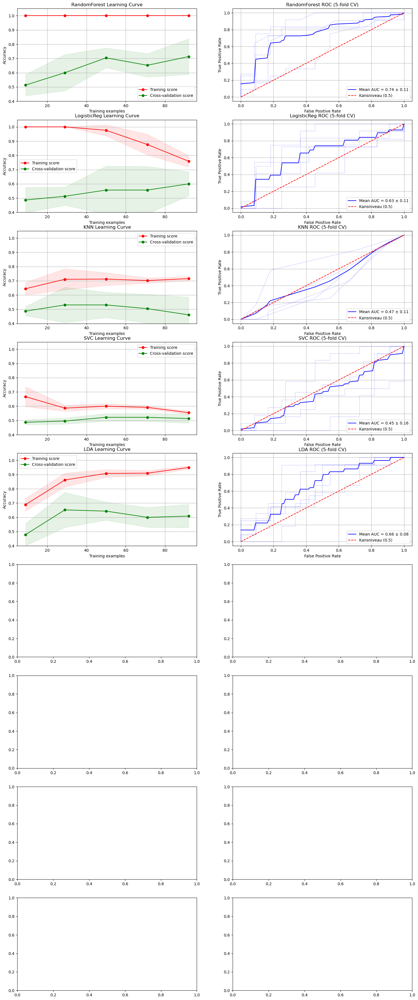

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Start Baseline Analyse voor 9 modellen...


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please a

ValueError: 
All the 25 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 6 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 17 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 25 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 35 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 46 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 16 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 23 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 33 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 24 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 5 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 34 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 45 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 4 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 15 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\pipeline.py", line 621, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\base.py", line 1336, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jente\miniforge3\Lib\site-packages\sklearn\discriminant_analysis.py", line 1122, in fit
    raise linalg.LinAlgError(
numpy.linalg.LinAlgError: The covariance matrix of class 0 is not full rank. When using `solver='svd'` the number of samples in each class should be more than the number of features, but class 0 has 32 samples and 493 features. Try using `solver='eigen'` and setting the parameter `shrinkage` for regularization.


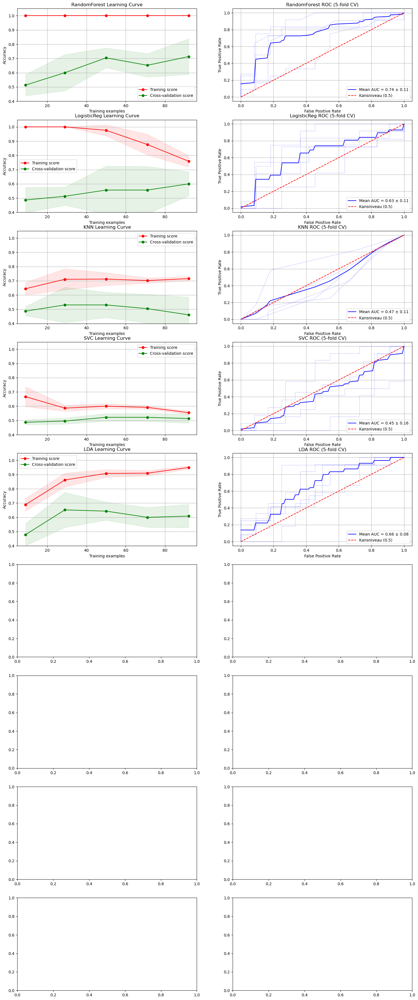

In [ ]:
from Stap_1b_visualisatie import plot_baseline_comparison

X_baseline = data.select_dtypes(include=[np.number])
if 'label' in X_baseline.columns:
    X_baseline = X_baseline.drop(columns=['label'])
y_baseline = data['label'].map({'lipoma': 0, 'liposarcoma': 1})

plot_baseline_comparison(X_baseline, y_baseline)

Klassen succesvol omgezet: {'lipoma': np.int64(0), 'liposarcoma': np.int64(1)}
DEBUG: 1 folds succesvol aangemaakt.
DEBUG: 2 folds succesvol aangemaakt.
DEBUG: 3 folds succesvol aangemaakt.
DEBUG: 4 folds succesvol aangemaakt.
DEBUG: 5 folds succesvol aangemaakt.

--- Fold 1---
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.8029
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.6942
Features reduced from 493 to 248 features after variation filtering
Features reduced from 248 to 165 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor XGBoost: 0.8246
⚠️ Kon namen niet matchen: Boolean index has wrong length: 165 instead of 493
Optimaal aantal features: 6


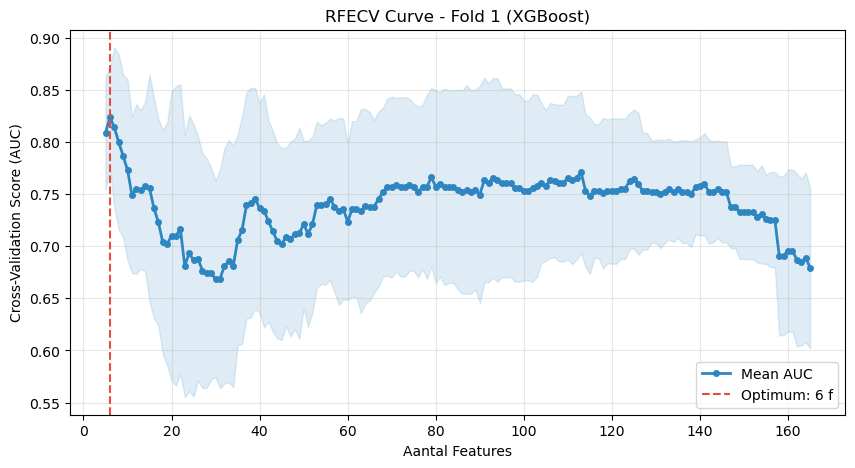


--- Fold 2---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7801
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.7041
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 166 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor XGBoost: 0.7918
⚠️ Kon namen niet matchen: Boolean index has wrong length: 166 instead of 493
Optimaal aantal features: 7


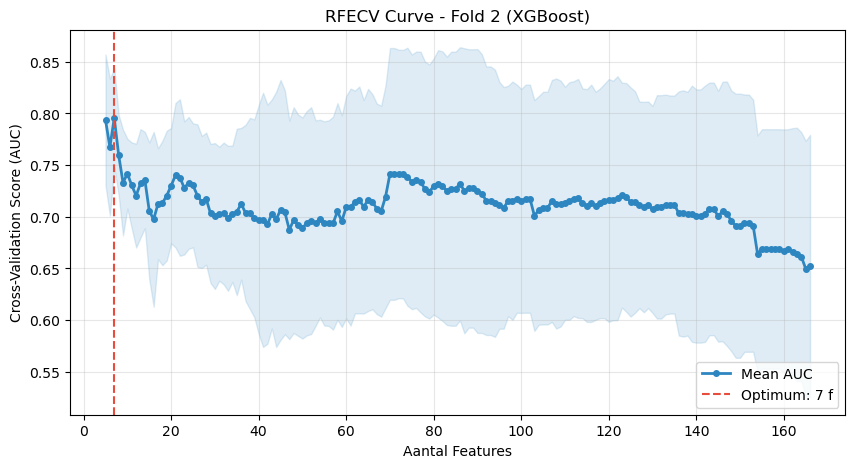


--- Fold 3---
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7175
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.6620
Features reduced from 493 to 250 features after variation filtering
Features reduced from 250 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor XGBoost: 0.7719
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 5


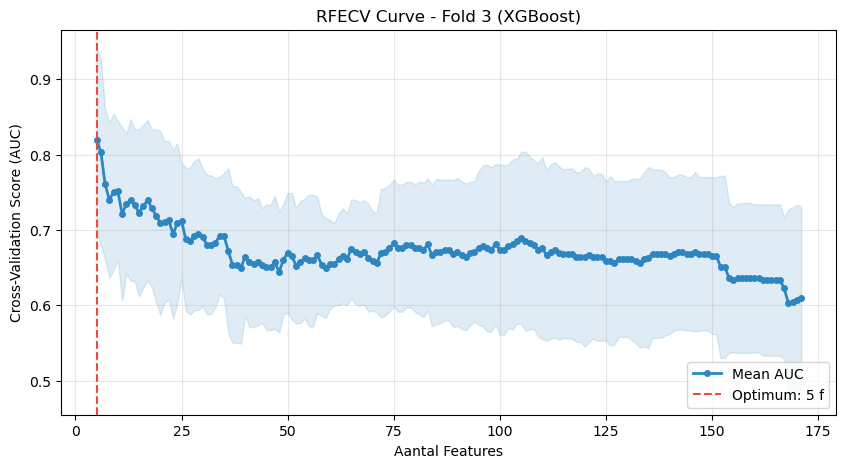


--- Fold 4---
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7287
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.6977
Features reduced from 493 to 252 features after variation filtering
Features reduced from 252 to 171 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor XGBoost: 0.7936
⚠️ Kon namen niet matchen: Boolean index has wrong length: 171 instead of 493
Optimaal aantal features: 6


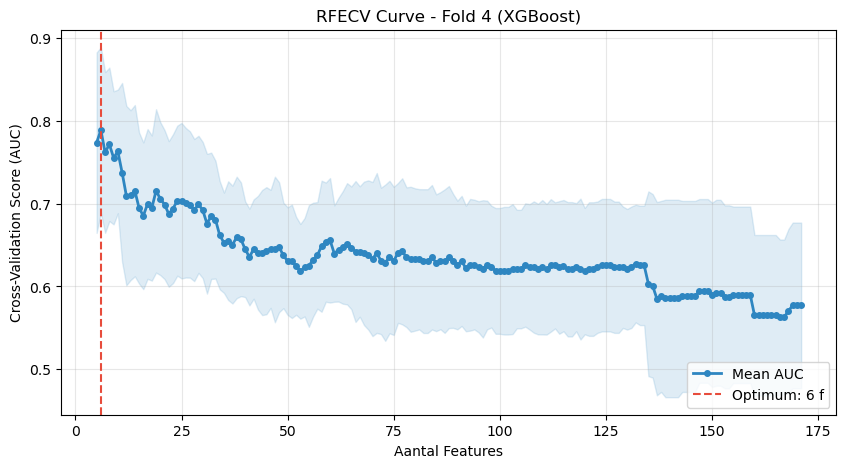


--- Fold 5---
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor RandomForest: 0.7246
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor LogisticRegression: 0.6708
Features reduced from 493 to 256 features after variation filtering
Features reduced from 256 to 167 features after correlation filtering


c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\jente\miniforge3\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalt

> Best voor XGBoost: 0.7702
⚠️ Kon namen niet matchen: Boolean index has wrong length: 167 instead of 493
Optimaal aantal features: 6


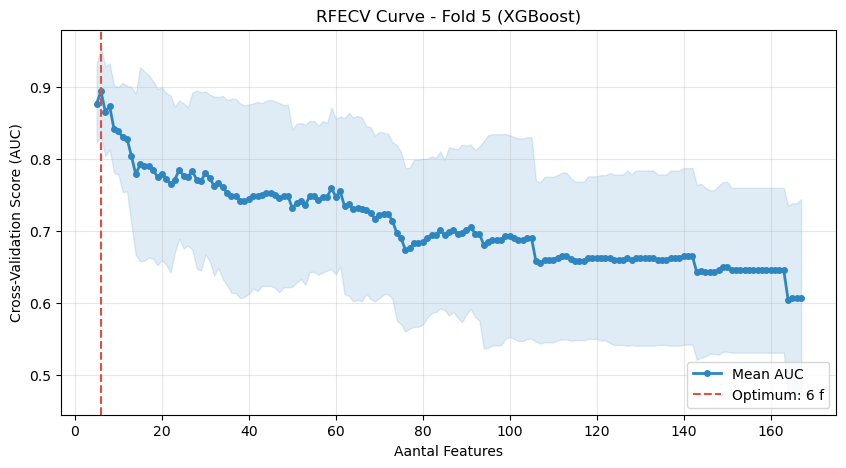

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Direct na het inladen van je data:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

print(f"Klassen succesvol omgezet: {dict(zip(le.classes_, le.transform(le.classes_)))}")
from Stap_2_kfolds_splitsing import kfold
from Stap_3_inner_loop import inner_loop
from Stap_7_Data_verzameling import analyse, resultaten

folds = kfold(data, target_column='label', n_splits=5)

feature_names = data.drop(columns=['label']).columns
alle_analyse_data =[]

for i, pakketje in enumerate(folds):
    print(f"\n--- Fold {i+1}---")
    X_train_outer, X_test_outer = pakketje['X_train'], pakketje['X_test']
    y_train_outer, y_test_outer = pakketje['y_train'], pakketje['y_test']

    # 1. Training
    beste_model, naam = inner_loop(X_train_outer, y_train_outer)

    # 2. Resultaten verzamelen
    data_fold = resultaten(beste_model, X_train_outer, y_train_outer, X_test_outer, y_test_outer, feature_names, naam)
    alle_analyse_data.append(data_fold)

#  --- VISUALISATIE & FEATURE ANALYSE ---
    if 'rfecv' in beste_model.named_steps:
        rfecv_stap = beste_model.named_steps['rfecv']
        filter_stap = beste_model.named_steps['feature_filter']
        
        # 1. Haal de namen op na de eerste filter stap
        # We kijken direct in de 'columns_to_keep_' van jouw VarianceCorrelationFilter
        if hasattr(filter_stap, 'columns_to_keep_'):
            namen_na_filter = filter_stap.columns_to_keep_
        else:
            # Als dat niet werkt, gebruiken we de originele X_train kolommen 
            # (Let op: dit werkt alleen als de filter niks heeft weggegooid, 
            #  anders krijg je een lengte-fout)
            namen_na_filter = X_train_outer.columns

        # 2. Welke zijn uiteindelijk door RFECV gekozen?
        rfecv_mask = rfecv_stap.support_
        
        # Match de namen (we zorgen dat de lengte klopt om errors te voorkomen)
        try:
            winnende_features = namen_na_filter[rfecv_mask]
            print(f"\n✅ Analyse Fold {i+1}:")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")
            print(f"Geselecteerde features: {winnende_features.tolist()}")
        except Exception as e:
            print(f"⚠️ Kon namen niet matchen: {e}")
            print(f"Optimaal aantal features: {rfecv_stap.n_features_}")

        # 3. Het Plaatje (Score vs Aantal Features)
        scores = rfecv_stap.cv_results_['mean_test_score']
        stds = rfecv_stap.cv_results_['std_test_score']
        
        # Bereken de x-as op basis van de testpunten en de stapgrootte (10)
        n_punten = len(scores)
        # De x-as moet lopen van min_features_to_select tot het totaal aantal features
        # dat de RFECV heeft gezien (n_features_in_)
        x_axis = np.linspace(rfecv_stap.min_features_to_select, 
                             rfecv_stap.min_features_to_select + (n_punten-1) * rfecv_stap.step, 
                             n_punten)

        plt.figure(figsize=(10, 5))
        plt.plot(x_axis, scores, color='#2E86C1', lw=2, marker='o', markersize=4, label='Mean AUC')
        plt.fill_between(x_axis, scores - stds, scores + stds, alpha=0.15, color='#2E86C1')
        
        plt.axvline(x=rfecv_stap.n_features_, color='#E74C3C', linestyle='--', 
                    label=f'Optimum: {rfecv_stap.n_features_} f')
        
        plt.title(f"RFECV Curve - Fold {i+1} ({naam})")
        plt.xlabel("Aantal Features")
        plt.ylabel("Cross-Validation Score (AUC)")
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show() 

In [ ]:
import joblib

# Sla het beste model van de allerlaatste fold op (of doe dit in de loop per fold)
bestandsnaam = f"best_model_{naam}.pkl"
joblib.dump(beste_model, bestandsnaam)

print(f"✅ Model is opgeslagen als {bestandsnaam}. Je kunt nu de computer afsluiten!")

✅ Model is opgeslagen als best_model_XGBoost.pkl. Je kunt nu de computer afsluiten!


In [ ]:
import pandas as pd

# 1. Haal de onderdelen uit de pipeline die nu in je geheugen zit
rfecv_stap = beste_model.named_steps['rfecv']
filter_stap = beste_model.named_steps['feature_filter']

# 2. Haal de namen op die de filter hebben overleefd (de 167 namen)
namen_na_filter = filter_stap.columns_to_keep_

# 3. Welke van die 167 heeft de RFECV aangevinkt als 'True'?
# We maken een lijstje van de namen waar het masker 'True' is
winnende_features = [namen_na_filter[i] for i in range(len(namen_na_filter)) if rfecv_stap.support_[i]]

# 4. Maak er een mooi tabelletje van voor Fold 5
df_top_features = pd.DataFrame({
    'Rank': range(1, len(winnende_features) + 1),
    'Radiomics Feature': winnende_features
})

print("\n--- RESULTAAT FOLD 5 ---")
print(f"Gekozen model: {naam}")
print(f"Aantal features: {len(winnende_features)}")
print(df_top_features.to_string(index=False))

# Optioneel: Sla het direct op als CSV zodat je het in Excel kunt openen
# df_top_features.to_csv("top_features_fold5.csv", index=False)

AttributeError: 'VarianceCorrelationFilter' object has no attribute 'columns_to_keep_'